In [1]:
!pip install tensorflow-gpu==1.15.0 tensorflow==1.15.0 stable-baselines #gym-anytrading gym
!pip install pfrl

     |████████████████████████████████| 411.5MB 40kB/s 
     |████████████████████████████████| 412.3MB 43kB/s 
     |████████████████████████████████| 245kB 38.6MB/s 
     |████████████████████████████████| 3.8MB 21.1MB/s 
     |████████████████████████████████| 51kB 5.3MB/s 
     |████████████████████████████████| 512kB 32.3MB/s 
  Created wheel for gast: filename=gast-0.2.2-cp37-none-any.whl size=7540 sha256=326ad94ae0befc31633b3e1c0d81e3ac43ca41710e6fdffe25b07a5ee381b879
  Stored in directory: /root/.cache/pip/wheels/5c/2e/7e/a1d4d4fcebe6c381f378ce7743a3ced3699feb89bcfbdadadd
Successfully built gast
ERROR: tensorflow-probability 0.12.1 has requirement gast>=0.3.2, but you'll have gast 0.2.2 which is incompatible.
  Found existing installation: tensorboard 2.4.1
    Uninstalling tensorboard-2.4.1:
      Successfully uninstalled tensorboard-2.4.1
  Found existing installation: gast 0.3.3
    Uninstalling gast-0.3.3:
      Successfully uninstalled gast-0.3.3
  Found existing installat

**Importing Dataset**

In [ ]:
import torch
import pfrl 
import numpy

In [ ]:
import pandas as pd

df = pd.read_csv('https://github.com/ene610/DRL_finance/blob/main/data/Binance_BTCUSDT_minute.csv?raw=true', skiprows=1)
df = df.rename(columns={'Volume USDT': 'volume'})
df = df.iloc[::-1]
df = df.drop(columns=['symbol', 'Volume BTC'])
df['date'] = pd.to_datetime(df['unix'],unit='ms')
df = df.set_index("date")
df = df.drop(columns=['unix'])
print(df.shape)
df.head(5)

(330483, 6)


,open,high,low,close,volume,tradecount
date,,,,,,
2020-09-11 20:40:00,10317.00,10317.01,10314.36,10316.00,340398.477553,342
2020-09-11 20:41:00,10316.00,10321.09,10316.00,10319.50,168497.705251,256
2020-09-11 20:42:00,10319.50,10320.31,10318.49,10319.34,125108.931436,193
2020-09-11 20:43:00,10319.34,10320.14,10318.89,10319.00,139806.963489,187
2020-09-11 20:44:00,10318.99,10319.72,10316.58,10319.47,149266.708094,284


**Implementing Env**

In [ ]:
# Gym stuff
import gym

# Stable baselines - rl stuff
from stable_baselines.common.vec_env import DummyVecEnv
from stable_baselines import A2C

# Processing libraries
import numpy as np
from enum import Enum
from matplotlib import pyplot as plt

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.



/usr/local/lib/python3.7/dist-packages/stable_baselines/__init__.py:33: UserWarning: stable-baselines is in maintenance mode, please use [Stable-Baselines3 (SB3)](https://github.com/DLR-RM/stable-baselines3) for an up-to-date version. You can find a [migration guide](https://stable-baselines3.readthedocs.io/en/master/guide/migration.html) in SB3 documentation.
  "stable-baselines is in maintenance mode, please use [Stable-Baselines3 (SB3)](https://github.com/DLR-RM/stable-baselines3) for an up-to-date version. You can find a [migration guide](https://stable-baselines3.readthedocs.io/en/master/guide/migration.html) in SB3 documentation."


In [ ]:
from enum import Enum

class Actions(Enum):
    # Mappo sono le azioni legittime nella forma:
    # StatoAzione
    DoNothing = 0
    OpenPosition = 1
    HoldPosition = 2
    ClosePosition = 3

    # Potrei anche mappare solo le quattro azioni e poi dare il reward negativo sull'azione in base alla posizione corrente (che comunque devo tenermi salvata)


class Positions(Enum):
    # La posizione è lo stato attuale in cui si trova l'algoritmo.
    # In Free è permesso solo di fare DoNothing e OpenPosition
    # in Long è permesso di fare solo HoldPosition e ClosePosition
    Free = 0
    Long = 1

    def opposite(self):
        return Positions.Free if self == Positions.Long else Positions.Long

In [ ]:
import pandas as pd
import numpy as np

class Indicators:

    @staticmethod
    def sma_indicator(df: pd.DataFrame, time_period: int = 21):
        """
        Get The expected indicator in a pandas dataframe.
        Args:
            df(pandas.DataFrame): pandas Dataframe with close values\n
            time_period(int): look back time period to calculate moving average \n
        Returns:
            pandas.DataFrame: new pandas dataframe adding SMA as new column, preserving the columns which already exists\n
        """

        df["SMA"] = df["close"].rolling(window=time_period).mean()
        return df

    @staticmethod
    def macd_indicator(df: pd.DataFrame, short_time_period: int = 12, long_time_period: int = 26, need_signal: bool = True, signal_time_period: int = 9):
        """
        Get The expected indicator in a pandas dataframe.
        Args:
            df(pandas.DataFrame): pandas Dataframe with close values\n
            short_time_period(int): short term look back time period.\n
            long_time_period(int): long term look back time period.\n
            need_signal(bool): if True MACD signal line is added as a new column to the returning pandas dataframe.\n
            signal_time_period(int): look back period to calculate signal line\n
        Returns:
            pandas.DataFrame: new pandas dataframe adding MACD and MACD_signal_line(if required) as new column/s, preserving the columns which already exists\n
        """

        df["LONG_EMA"] = df["close"].ewm(span=long_time_period).mean()
        df["SHORT_EMA"] = df["close"].ewm(span=short_time_period).mean()

        df["MACD"] = df["SHORT_EMA"] - df["LONG_EMA"]
        if need_signal:
            df["MACD_signal_line"] = df["MACD"].ewm(span=signal_time_period).mean()

        df = df.drop(["LONG_EMA", "SHORT_EMA"], axis=1)
        return df

    @staticmethod
    def atr_indicator(df: pd.DataFrame, time_period: int = 14):
        """
        Get The expected indicator in a pandas dataframe.
        Args:
            df(pandas.DataFrame): pandas Dataframe with high, low and close values\n
            time_period(int): look back period to calculate ATR
        Returns:
            pandas.DataFrame: new pandas dataframe adding ATR as a new column, preserving the columns which already exists
        """

        df["close_prev"] = df["close"].shift(1)
        df["TR"] = df[["high", "close_prev"]].max(
            axis=1) - df[["low", "close_prev"]].min(axis=1)
        df["ATR"] = df["TR"].rolling(window=time_period).mean()

        df = df.drop(["close_prev", "TR"], axis=1)
        return df

    @staticmethod
    def ema_indicator(df: pd.DataFrame, time_period: int = 21):
        """
        Get The expected indicator in a pandas dataframe.
        Args:
            df(pandas.DataFrame): pandas Dataframe with close values\n
            time_period(int): look back time period\n
        Returns:
            pandas.DataFrame: new pandas dataframe adding EMA as a new column, preserving the columns which already exists\n
        """
        df["EMA"] = df["close"].ewm(span=time_period).mean()
        return df


    @staticmethod
    def kc_indicator(df: pd.DataFrame, time_period: int = 20, atr_time_period: int = 14, atr_multiplier: int = 2):
        """
        Get The expected indicator in a pandas dataframe.
        Args:
            df(pandas.DataFrame): pandas Dataframe with close values\n
            time_period(int): look back time period to calculate moving average
            atr_time_period(int): time period to calculate average true range
            atr_multiplier(int): constant value which will be multiplied by average true range
        Returns:
            pandas.DataFrame: new pandas dataframe adding kc_upper, kc_middle and kc_lower as three columns, preserving the columns which already exists\n
        """

        df["kc_middle"] = df["close"].ewm(span=time_period).mean()
        df = Indicators.atr_indicator(df, atr_time_period)

        df["kc_upper"] = df["kc_middle"] + atr_multiplier * df["ATR"]
        df["kc_lower"] = df["kc_middle"] - atr_multiplier * df["ATR"]

        df = df.drop(["ATR"], axis=1)

        return df


    @staticmethod
    def rsi_indicator(df, time_period=14):
        """
        Get The expected indicator in a pandas dataframe.
        Args:
            df(pandas.DataFrame): pandas Dataframe with close values\n
            time_period(int): look back time period to calculate moving average \n
        Returns:
            pandas.DataFrame: new pandas dataframe adding RSI as new column, preserving the columns which already exists\n
        """

        df["close_prev"] = df["close"].shift(1)

        df["GAIN"] = 0.0
        df["LOSS"] = 0.0

        df.loc[df["close"] > df["close_prev"],
               "GAIN"] = df["close"] - df["close_prev"]
        df.loc[df["close_prev"] > df["close"],
               "LOSS"] = df["close_prev"] - df["close"]
        df["AVG_GAIN"] = df["GAIN"].ewm(span=time_period).mean()
        df["AVG_LOSS"] = df["LOSS"].ewm(span=time_period).mean()
        df["AVG_GAIN"].iloc[:time_period] = np.nan
        df["AVG_LOSS"].iloc[:time_period] = np.nan
        df["RS"] = df["AVG_GAIN"] / \
                   (df["AVG_LOSS"] + 0.00000001)  # to avoid divide by zero

        df["RSI"] = 100 - ((100 / (1 + df["RS"])))

        df = df.drop(["close_prev", "GAIN", "LOSS",
                      "AVG_GAIN", "AVG_LOSS", "RS"], axis=1)
        return df


    @staticmethod
    def mom_indicator(df: pd.DataFrame, time_period=1):
        """
        MOM -> Momentum
        Momentum helps to determine the price changes from one period to another. \n
        \n Links:
            http://www.ta-guru.com/Book/TechnicalAnalysis/TechnicalIndicators/Momentum.php5\n
        """
        """
                Get The expected indicator in a pandas dataframe.
                Args:
                    df(pandas.DataFrame): pandas Dataframe with close values\n
                    time_period(int): look back time period.\n
                Returns:
                    pandas.DataFrame: new pandas dataframe adding MOM as a new column, 
                    preserving the columns which already exists\n
                """
        df["close_prev"] = df["close"].shift(time_period)
        df["MOM"] = df["close"] - df["close_prev"]
        df.drop(columns="close_prev")
        return df

    @staticmethod
    def vhf_indicator(df: pd.DataFrame, time_period: int = 28):
        """
                Get The expected indicator in a pandas dataframe.
                Args:
                    df(pandas.DataFrame): pandas Dataframe with close values\n
                    time_period(int): look back time period\n
                Returns:
                    pandas.DataFrame: new pandas dataframe adding VHF as new column, preserving the columns which already exists\n
                """
        df["PC"] = df["close"].shift(1)
        df["DIF"] = abs(df["close"] - df["PC"])

        df["HC"] = df["close"].rolling(window=time_period).max()
        df["LC"] = df["close"].rolling(window=time_period).min()

        df["HC-LC"] = abs(df["HC"] - df["LC"])

        df["DIF"] = df["DIF"].rolling(window=time_period).sum()

        df["VHF"] = df["HC-LC"] / df["DIF"]

        df = df.drop(["PC", "DIF", "HC", "LC", "HC-LC"], axis=1)

        return df


    @staticmethod
    def trix_indicator(df: pd.DataFrame, time_period: int = 14):
            """
            Get The expected indicator in a pandas dataframe.
            Args:
                df(pandas.DataFrame): pandas Dataframe with close values\n
                time_period(int): look back time period \n
            Returns:
                pandas.DataFrame: new pandas dataframe adding Trix as new column, preserving the columns which already exists\n
            """

            df["EMA1"] = df["close"].ewm(span=time_period).mean()
            df["EMA2"] = df["EMA1"].ewm(span=time_period).mean()
            df["EMA3"] = df["EMA2"].ewm(span=time_period).mean()
            df["EMA_prev"] = df["EMA3"].shift(1)

            df["TRIX"] = (df["EMA3"] - df["EMA_prev"]) / \
                         df["EMA_prev"] * 100
            df = df.drop(["EMA1", "EMA2", "EMA3", "EMA_prev"], axis=1)
            return df

    @staticmethod
    def rocv_indicator(df: pd.DataFrame, time_period: int = 12):
        """
           ROCV -> Rate of Change Volume
           ROCV indicator is used to identify whether the price movement is confirmed by trading volume.
            Links:
               http://www.ta-guru.com/Book/TechnicalAnalysis/TechnicalIndicators/VolumeRateOfChange.php5
               https://www.investopedia.com/articles/technical/02/091002.asp
           """

        """
        Get The expected indicator in a pandas dataframe.
        Args:
            df(pandas.DataFrame): pandas Dataframe with volume values\n
            time_period(int): look back time period\n
        Returns:
            pandas.DataFrame: new pandas dataframe adding ROCV as new column, preserving the columns which already exists\n
        """
        df["prev_volume"] = df["volume"].shift(time_period)
        df["ROCV"] = (df["volume"] - df["prev_volume"]
                      ) / df["prev_volume"] * 100
        df = df.drop(["prev_volume"], axis=1)


        return df

In [ ]:
from enum import Enum
import gym
from gym import spaces
from gym.utils import seeding
import numpy as np
import matplotlib.pyplot as plt

class Actions(Enum):
    # Mappo sono le azioni legittime nella forma:
    # StatoAzione
    DoNothing = 0
    OpenPosition = 1
    HoldPosition = 2
    ClosePosition = 3

    # Potrei anche mappare solo le quattro azioni e poi dare il reward negativo sull'azione in base alla posizione corrente (che comunque devo tenermi salvata)


class Positions(Enum):
    # La posizione è lo stato attuale in cui si trova l'algoritmo.
    # In Free è permesso solo di fare DoNothing e OpenPosition
    # in Long è permesso di fare solo HoldPosition e ClosePosition
    Free = 0
    Long = 1

    def opposite(self):
        return Positions.Free if self == Positions.Long else Positions.Long


class CryptoTradingEnv(gym.Env):
    metadata = {'render.modes': ['human']}

    def __init__(self, df, frame_bound, window_size, indicators=None):
        assert df.ndim == 2
        assert len(frame_bound) == 2
        self.indicators_to_use = indicators
        self.seed()
        self.df = df
        self.frame_bound = frame_bound
        self.window_size = window_size
        self.prices, self.signal_features = self._process_data()

        # TODO metti nel init il flag
        self.position_in_observation = True
        if self.position_in_observation:
            self.shape = (window_size + 1, self.signal_features.shape[1])
        else:
            self.shape = (window_size, self.signal_features.shape[1])
        self.invalid_action_stop = True
        self._invalid_action = False
        # spaces
        self.action_space = spaces.Discrete(len(Actions))
        self.observation_space = spaces.Box(low=-np.inf, high=np.inf, shape=self.shape, dtype=np.float32)

        # episode
        self._balance = 10000.
        self._start_tick = self.window_size
        self._end_tick = len(self.prices) - 1
        self._done = None
        self._current_tick = None
        self._open_position_tick = None
        self._holding_price_difference = np.zeros(0)
        self._last_trade_tick = None
        self._position = Positions.Free
        self._position_history = None
        self._total_reward = 0.
        self._total_profit = 0.
        self._balance = 10000
        self._first_rendering = None
        self.history = None
        self._max_profit = self.maxProfit()

    def seed(self, seed=None):
        self.np_random, seed = seeding.np_random(seed)
        return [seed]

    def reset(self):
        self._invalid_action = False
        self._balance = 10000.
        self._done = False
        self._current_tick = self._start_tick
        self._open_position_tick = 0
        self._last_trade_tick = self._current_tick - 1
        self._position = Positions.Free
        self._position_history = (self.window_size * [0]) + [self._position]
        self._total_reward = 0.
        self._total_profit = 0.  # unit
        self._first_rendering = True
        self.history = {}
        self._holding_price_difference = np.zeros(0)
        self._count_invalid_action = 0
        return self._get_observation()

    def step(self, action):
        '''
        Responsabilità di step():
            1. calcolare il profit attraverso la funzione di update_profit
            2. calcolare step_reward, position, open_position_tick tramite la funzione calculate_reward()
            4. aggiornare la history delle posizioni
        '''
        self._invalid_action = False
        self._done = False
        self._current_tick += 1

        if self._current_tick == self._end_tick:
            self._done = True

        self._update_profit(action)
        # Attenzione! self._position viene cambiata in step_reward quindi update_profit() deve essere chiamato prima
        step_reward = self._calculate_reward(action)
        if self._invalid_action:
            self._current_tick -= 1
        else:
            self._position_history.append(self._position)
        observation = self._get_observation()
        info = dict(
            total_reward=self._total_reward,
            total_profit=self._total_profit,
            balance=self._balance,
            position=self._position.value
        )
        self._update_history(info)

        return observation, step_reward, self._done, info

    def _calculate_reward(self, action):
        '''
        Responsabilità di calculate_reward:
            1. Calcolare il reward
            2. Aggiornare self._total_reward
            3. Aggiornare self._position
            4. Aggiornare self._open_position_tick

        Logica di reward per azioni LEGITTIME:
                    - ClosePosition (da Long a Free) = profit di quella posizione
                    - OpenPosition (da Free a Long) = reward di incentivo per aprire posizione
                    - HoldPosition (da Long a Long) = profit che verrebbe fatta da quando si è aperta la posizione se si vendesse in quel momento
                    - DoNothing (da Free a Free) = 0 di reward, non punisco e lo incentivo in nessun modo su questa posizione

        Logica di reward per azioni ILLEGITTIME (tutte le coppie non listate sopra):
                    - Do un piccolo reward negativo di disincentivo per tutte le azioni illeggitime
                        ma non faccio cambiare il sistema

        Funzione di transizione: (Stato, Azione) -> Stato

        :param action:
        :return:
        '''
        # è negativo quando fa un'azione invalida?
        step_reward = -10
        new_position = self._position

        # (Free, DoNothing) -> Free
        if action == Actions.DoNothing.value and self._position == Positions.Free:
            step_reward = 0

        # (Free, OpenPosition) -> Long
        elif action == Actions.OpenPosition.value and self._position == Positions.Free:
            new_position = self._position.opposite()
            self._open_position_tick = self._current_tick
            # 1 è troppo alto? Ma se metto a 0.95 fa un trade ogni ora
            # così ne fa uno ogni due tre minuti
            step_reward = 0.15

        # 0 aperta posizione a 10
        # holding_rewards = []
        # 1 prezzo a 12 -> hold 12-10 / 10 = 0.2 = 0.2
        # 2 prezzo a 15 -> hold 15-10 / 10 => (0.5 +0.2) / 2 = 0.35
        # 3 prezzo a 13 -> hold 0.3 + 0.5 + 0.2 / 3 = 0.33

        # scendi invece di salire
        # holding_rewards = []
        # 4 prezzo a 8 -> hold 8-10 / 10 = -0.2
        # 5 prezzo a 5 -> hold 5-10/10 = -0.5 -0.2 + 0.3 + 0.5 + 0.2 / 5 = 0.06
        # 6 prezzoa a 15 -> hold

        # (Long, HoldPosition) -> Long
        elif action == Actions.HoldPosition.value and self._position == Positions.Long:
            current_price = self.prices[self._current_tick]
            open_position_price = self.prices[self._open_position_tick]
            price_diff = (current_price - open_position_price) / open_position_price
            # reward = media dei reward ottenuti dall'hodlding?

            if self._holding_price_difference.size > 1:
                if price_diff / price_diff != self._holding_price_difference[0] / self._holding_price_difference[0]:
                    self._holding_price_difference = np.zeros(0)

            self._holding_price_difference = np.append(self._holding_price_difference, price_diff)
            step_reward = np.mean(self._holding_price_difference)

        # (Long, ClosePosition) -> Free
        elif action == Actions.ClosePosition.value and self._position == Positions.Long:
            new_position = self._position.opposite()
            current_price = self.prices[self._current_tick]
            open_position_price = self.prices[self._open_position_tick]
            price_diff = current_price - open_position_price
            # current_price - open_position_price > 0 ==> step_reawrd = 1
            # < 0 ==> step_reward = -1
            # step_reward += price_diff
            if price_diff >= 0:
                step_reward = 1
            else:
                step_reward = -1
            self._holding_price_difference = np.zeros(0)
        else:
            if self.invalid_action_stop:
                self.invalid_action = True
                self._count_invalid_action += 1

        self._total_reward += step_reward
        self._position = new_position
        return step_reward

    def _update_profit(self, action):
        '''
                Responsabilità di update_profit():
                    1. Aggiornare self._total_profit con il profit reale
                    2. Aggiornare self._balance con il balance dopo la chiusura della transazione
                :param action:
                :return:
        '''
        temp_balance = self._balance
        if action == Actions.ClosePosition.value and self._position == Positions.Long:
            current_price = self.prices[self._current_tick]
            open_position_price = self.prices[self._open_position_tick]
            self._balance = (self._balance / open_position_price) * current_price
            # se total profit inizializzato a 0
            self._total_profit += self._balance - temp_balance

    def _get_observation(self):
        signal_obs = self.signal_features[(self._current_tick - self.window_size):self._current_tick]
        obs = []

        if self.position_in_observation:
            position_obs = [self._position.value] * self.signal_features.shape[1]

            obs = np.append(signal_obs, position_obs)
        else:
            obs = signal_obs

        return obs

    def _update_history(self, info):
        if not self.history:
            self.history = {key: [] for key in info.keys()}

        for key, value in info.items():
            self.history[key].append(value)

    def render(self, mode='human'):
        def _plot_position(position, tick):
            color = None
            if position == Positions.Free:
                color = 'red'
            elif position == Positions.Long:
                color = 'green'
            if color:
                plt.scatter(tick, self.prices[tick], color=color)

        if self._first_rendering:
            self._first_rendering = False
            plt.cla()
            plt.plot(self.prices)
            start_position = self._position_history[self._start_tick]
            _plot_position(start_position, self._start_tick)

        _plot_position(self._position, self._current_tick)

        plt.suptitle(
            "Total Reward: %.6f" % self._total_reward + ' ~ ' +
            "Total Profit: %.6f" % self._total_profit + ' ~ ' +
            "Total Balance: %.6f" % self._balance + ' ~ ' 
            
        )

        plt.pause(0.01)

    def render_all(self, mode='human'):
        window_ticks = np.arange(len(self._position_history))
        plt.plot(self.prices)

        short_ticks = []
        long_ticks = []
        for i, tick in enumerate(window_ticks):
            if self._position_history[i] == Positions.Free:
                short_ticks.append(tick)
            elif self._position_history[i] == Positions.Long:
                long_ticks.append(tick)

        plt.plot(short_ticks, self.prices[short_ticks], 'ro')
        plt.plot(long_ticks, self.prices[long_ticks], 'go')

        plt.suptitle(
            "Total Reward: %.6f" % self._total_reward + ' ~ ' +
            "Total Profit: %.6f" % self._total_profit + ' ~ ' +
            "Balance: %.6f" % self._balance + ' ~ ' +
            "Invalid Action: %.6f" % self._count_invalid_action + ' ~ ' +
            "Max profit: %.6f" % self._max_profit
        )

    def close(self):
        plt.close()
        # print

    def save_rendering(self, filepath):
        plt.savefig(filepath)

    def pause_rendering(self):
        plt.show()

    def _process_data(self):
        prices = self.df['close'].to_numpy()

        # prices[self.frame_bound[0] - self.window_size]  # validate index (TODO: Improve validation)
        prices = prices[self.frame_bound[0] - self.window_size:self.frame_bound[1]]

        # diff = np.insert(np.diff(prices), 0, 0)
        # signal_features = np.column_stack((prices, diff))

        signal_features = Indicators.sma_indicator(self.df)
        signal_features = Indicators.macd_indicator(signal_features)
        signal_features = Indicators.atr_indicator(signal_features)
        signal_features = Indicators.ema_indicator(signal_features)
        signal_features = Indicators.kc_indicator(signal_features)

        signal_features = Indicators.rsi_indicator(signal_features)
        signal_features = Indicators.mom_indicator(signal_features)
        signal_features = Indicators.vhf_indicator(signal_features)
        signal_features = Indicators.trix_indicator(signal_features)
        signal_features = Indicators.rocv_indicator(signal_features)
        signal_features = signal_features.drop(columns=['open', 'high', 'low', 'close', 'volume', 'tradecount'])
        signal_features = signal_features.dropna()

        signal_features.reset_index(drop=True, inplace=True)

        signal_features = self.filter_indicators(signal_features)
        signal_features = signal_features.round(decimals=3)

        return prices, signal_features.to_numpy()

    #############################################################################################################

    def max_possible_profit(self):  # trade fees are ignored
        raise NotImplementedError

    # ipoteticamente questa funzione può esser sostituita da una serie di if in _process_data
    # solo che mi pareva una pecionata
    def filter_indicators(self, signal_features):
        '''
                        Responsabilità di filter_indicators():
                            1. Filtrare le colonne che si vogliono utilizzare come osservazioni
                                attraverso la differenza tra l'insieme  degli indicatori calcolati
                                in _process_data e quelli indicati nel init nella variabile self.indicators_to_use
                        :param signal_features: Dataframe con tutti gli indicatori
                        :return filtered_signal_feature: Dataframe contente gli indicatori selezionati in init
        '''
        # self.indicators_to_use = ['SMA', 'MACD', 'MACD_signal_line', 'EMA', 'kc_middle', 'kc_upper', 'kc_lower', 'RSI', 'close_prev', 'MOM', 'VHF', 'TRIX', 'ROCV']
        self.indicators_to_use = ['MACD', 'MACD_signal_line', 'MOM', 'VHF', 'TRIX']
        indicators_column_to_filter = np.setdiff1d(signal_features.columns, self.indicators_to_use, assume_unique=True)
        filtered_signal_feature = signal_features.drop(columns=indicators_column_to_filter)

        return filtered_signal_feature

    def maxProfit(self):

        price = self.prices[self.window_size:]
        k = int(len(price) / 2)
        n = len(price)

        # Bottom-up DP approach
        profit = [[0 for i in range(k + 1)] for j in range(n)]

        # Profit is zero for the first
        # day and for zero transactions
        for i in range(1, n):

            for j in range(1, k + 1):
                max_so_far = 0

                for l in range(i):
                    max_so_far = max(max_so_far, price[i] -
                                     price[l] + profit[l][j - 1])

                profit[i][j] = max(profit[i - 1][j], max_so_far)

        return profit[n - 1][k]



**Register and Init Env**

In [ ]:
id_str = 'cryptostocks-v1'

del  gym.envs.registry.env_specs['cryptostocks-v1']

from gym.envs.registration import register
register(
    id=id_str,
    entry_point=CryptoTradingEnv,
)

**Declare and Train Agent**

In [ ]:

env = gym.make(id_str, df=df, frame_bound=(66,250), window_size=22)
a = env.reset()

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


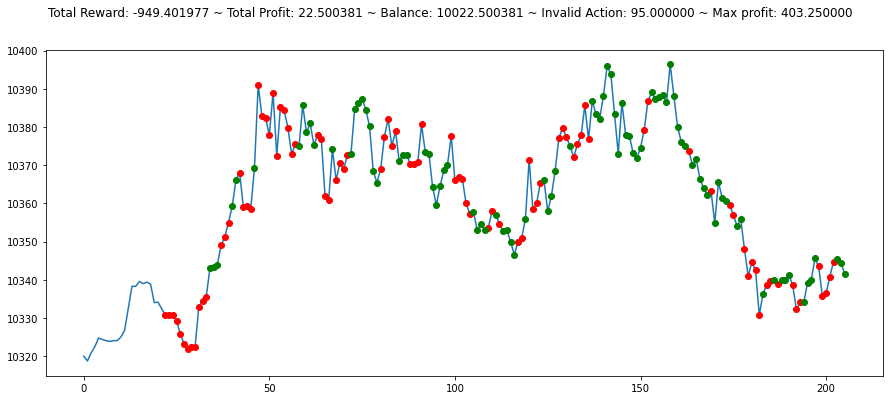

In [ ]:
#Prova enviroment con Random Agent


while True: 
    action = env.action_space.sample()
    

    n_state, reward, done, info = env.step(action)
    #print(n_state)
    if done: 
        break

plt.figure(figsize=(15,6))
plt.cla()
env.render_all()
plt.show()

In [ ]:
#PFRL

In [ ]:
class QFunction(torch.nn.Module):

    def __init__(self, obs_size, n_actions):
        super().__init__()
        self.l1 = torch.nn.Linear(obs_size, 360)
        self.l2 = torch.nn.Linear(360, 360)
        self.l3 = torch.nn.Linear(360, 512)
        self.l4 = torch.nn.Linear(512, 360)
        self.l5 = torch.nn.Linear(360, 50)
        self.l6 = torch.nn.Linear(50, n_actions)

    def forward(self, x):
        h = x
        h = torch.nn.functional.leaky_relu(self.l1(h))
        h = torch.nn.functional.leaky_relu(self.l2(h))
        h = torch.nn.functional.leaky_relu(self.l3(h))
        h = torch.nn.functional.leaky_relu(self.l4(h))
        h = torch.nn.functional.leaky_relu(self.l5(h))
        h = self.l6(h)
        return pfrl.action_value.DiscreteActionValue(h)

obs_size = env.observation_space.low.size
n_actions = env.action_space.n
q_func = QFunction(obs_size, n_actions)

In [ ]:
# Use Adam to optimize q_func. eps=1e-2 is for stability.
optimizer = torch.optim.Adam(q_func.parameters(), eps=1e-2)

In [ ]:
# Set the discount factor that discounts future rewards.
gamma = 0.9

# Use epsilon-greedy for exploration
explorer = pfrl.explorers.ConstantEpsilonGreedy(
    epsilon=0.3, random_action_func=env.action_space.sample)
explorer = pfrl.explorers.Boltzmann()
# DQN uses Experience Replay.
# Specify a replay buffer and its capacity.
replay_buffer = pfrl.replay_buffers.ReplayBuffer(capacity=10 ** 6)

# Since observations from CartPole-v0 is numpy.float64 while
# As PyTorch only accepts numpy.float32 by default, specify
# a converter as a feature extractor function phi.
phi = lambda x: x.astype(numpy.float32, copy=False)

# Set the device id to use GPU. To use CPU only, set it to -1.
gpu = -1

# Now create an agent that will interact with the environment.
agent = pfrl.agents.DoubleDQN(
    q_func,
    optimizer,
    replay_buffer,
    gamma,
    explorer,
    replay_start_size=500,
    update_interval=1,
    target_update_interval=100,
    phi=phi,
    gpu=gpu,
)

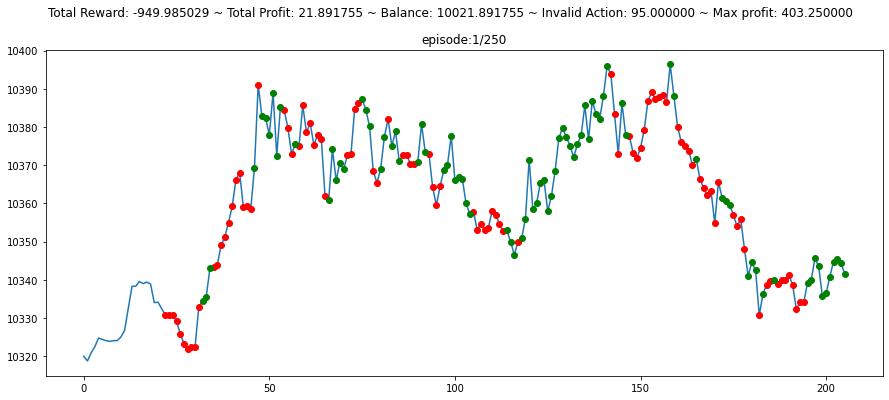

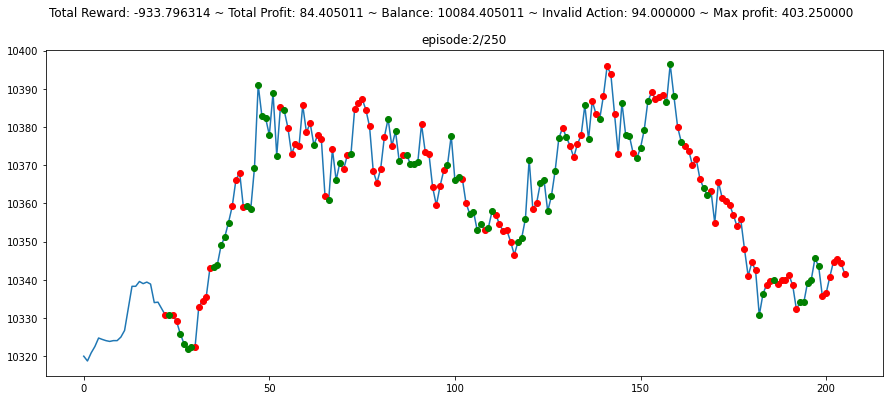

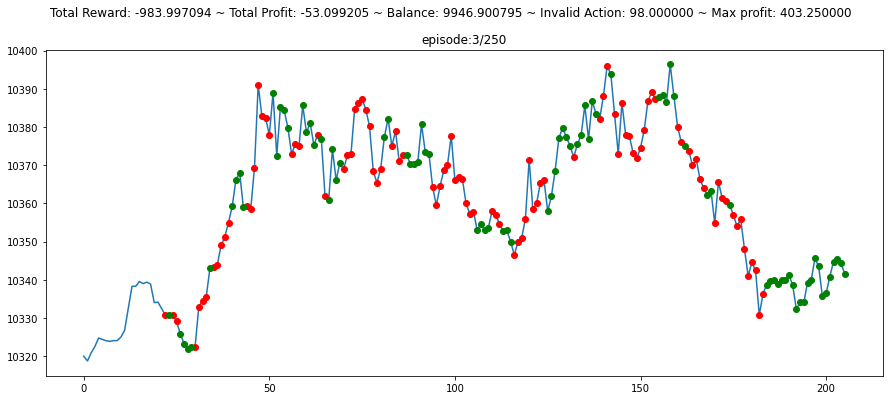

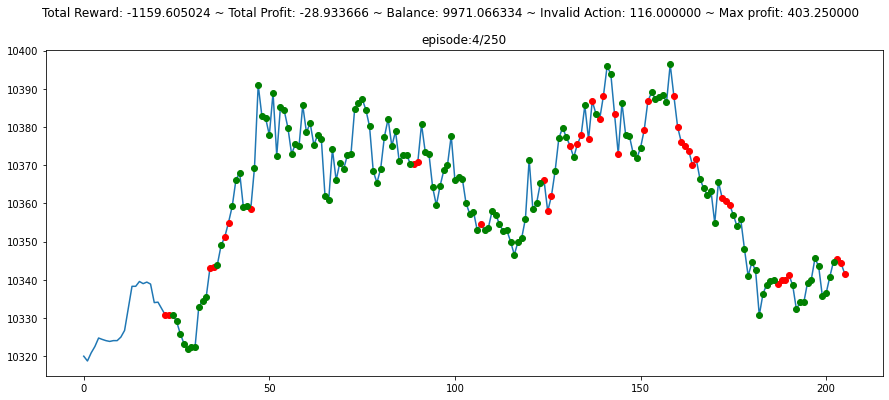

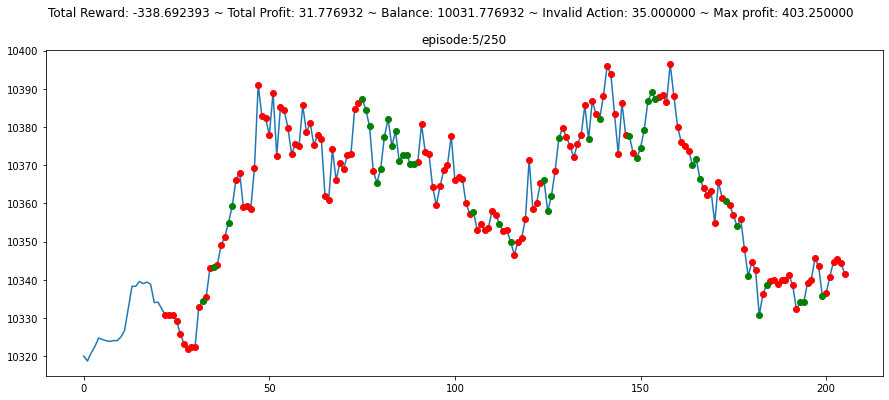

...

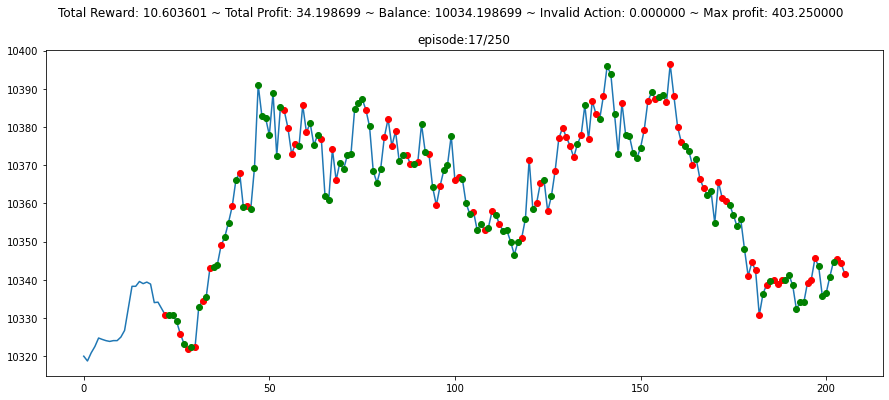

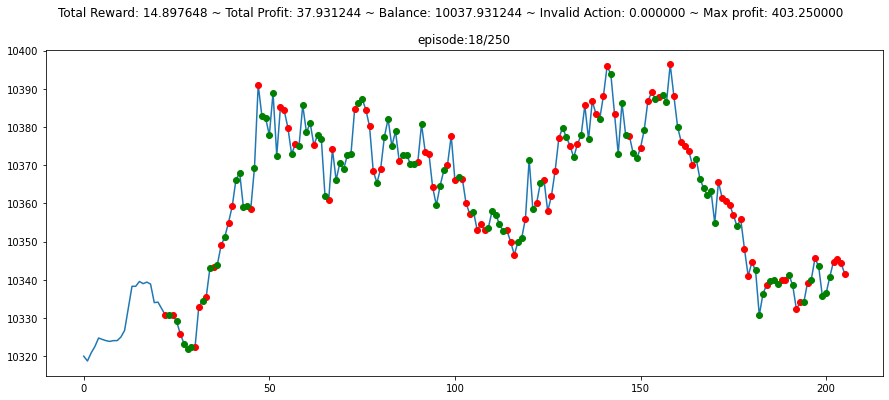

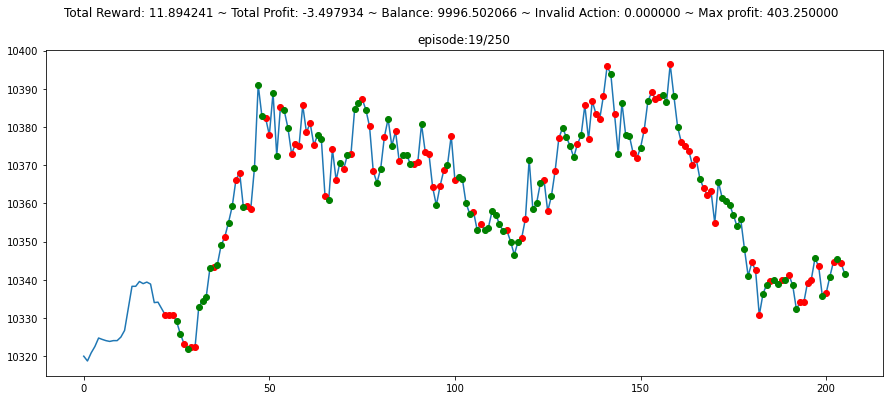

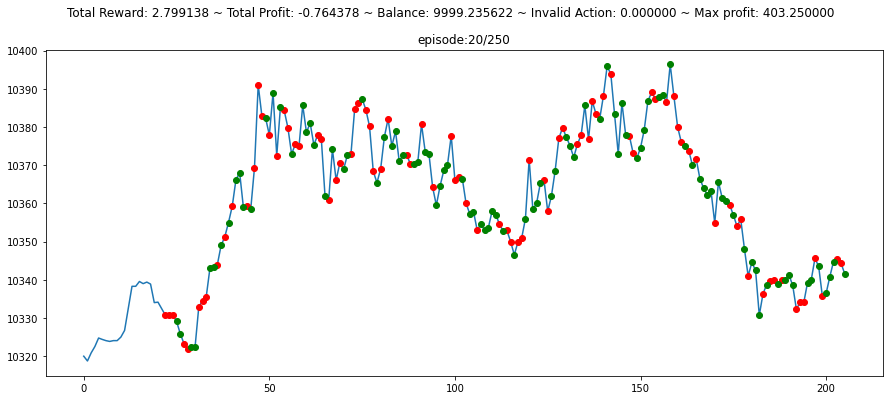

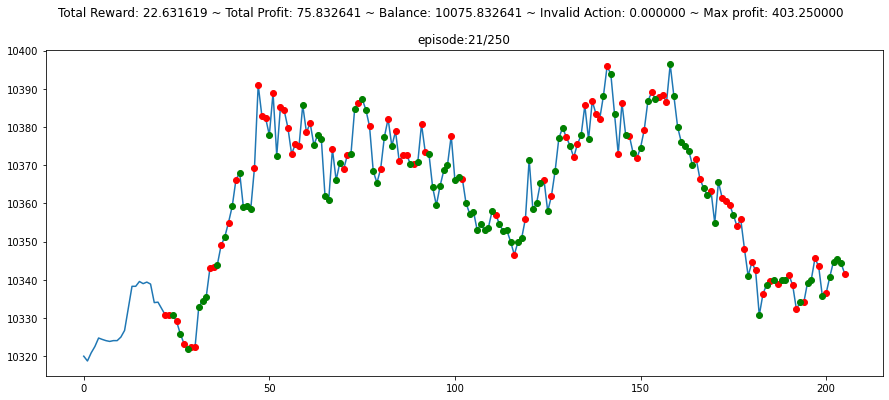

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:185: RuntimeWarning: invalid value encountered in double_scalars


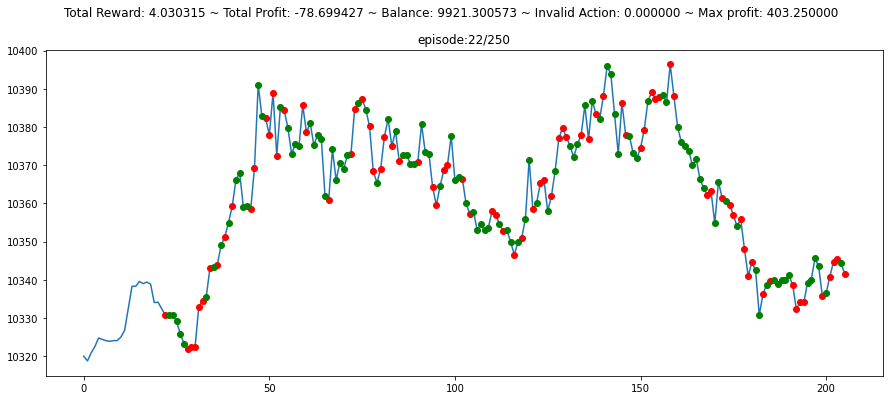

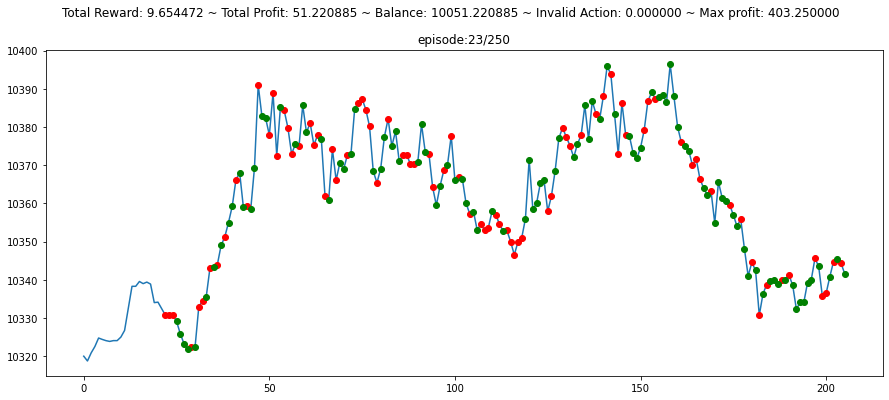

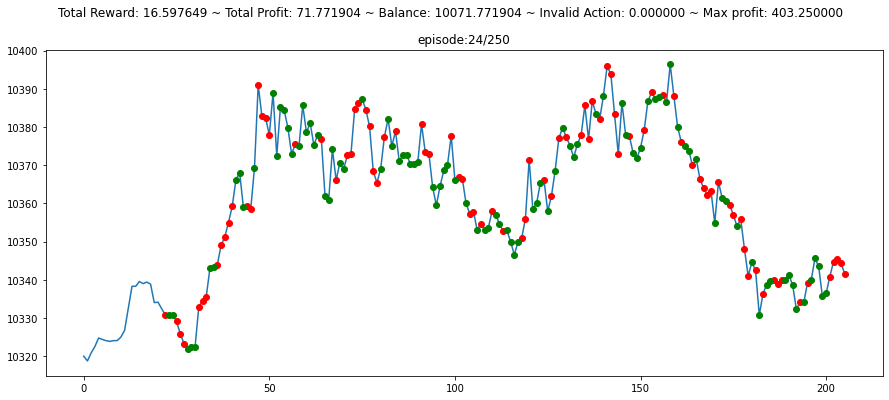

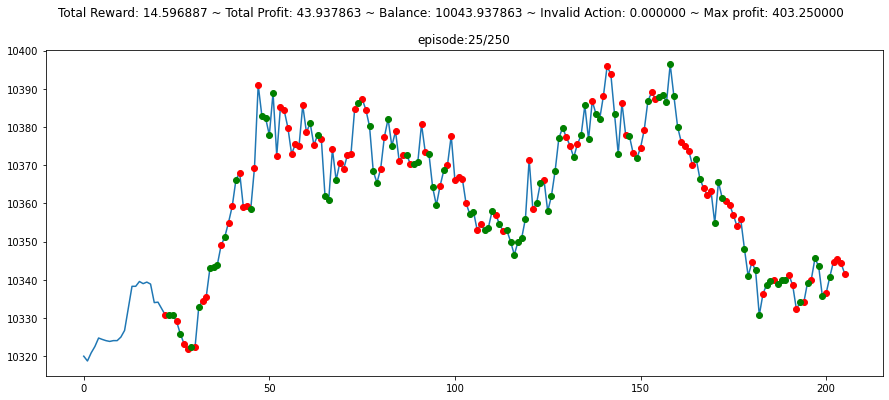

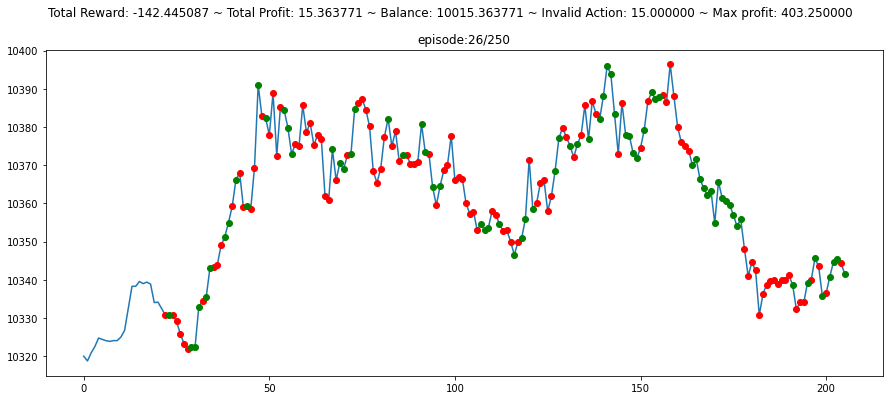

...

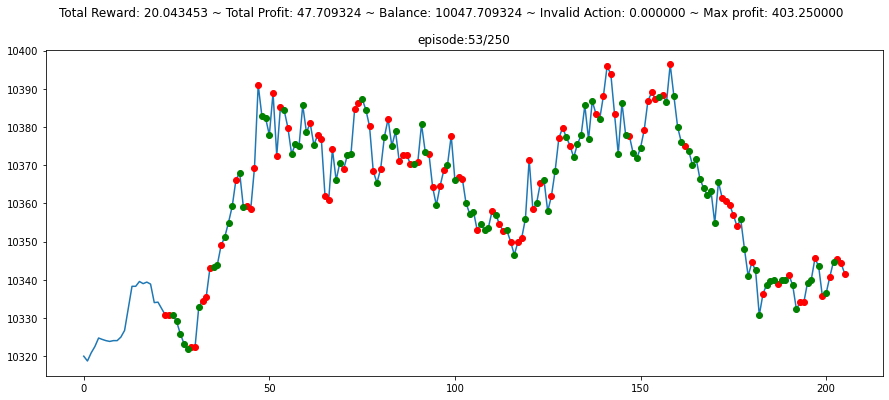

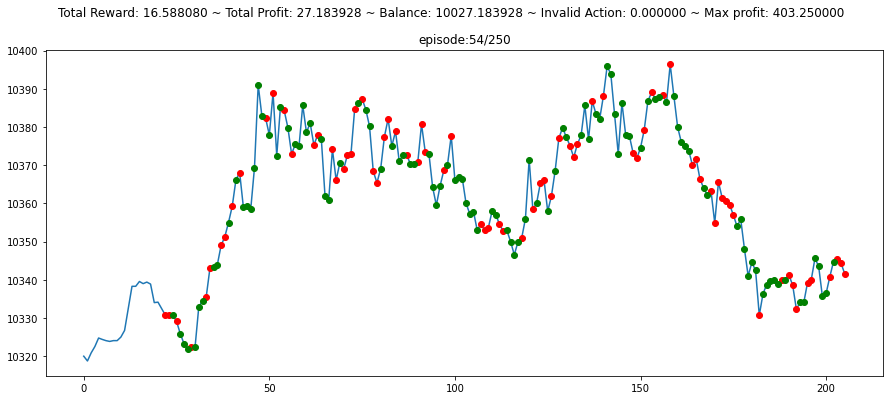

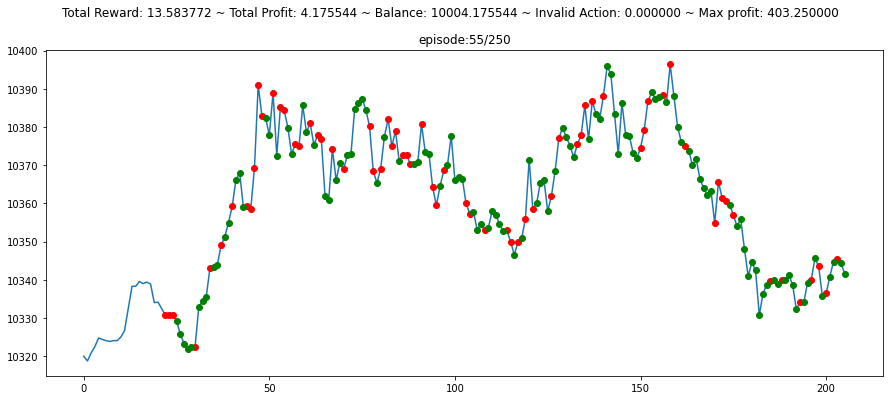

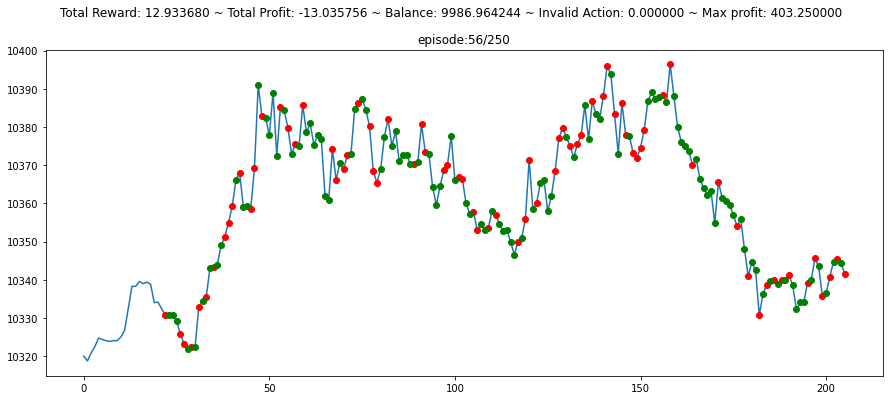

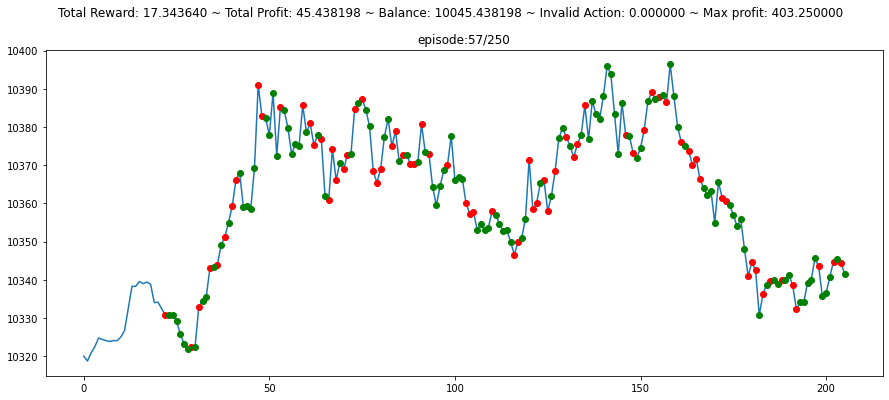

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:185: RuntimeWarning: invalid value encountered in double_scalars


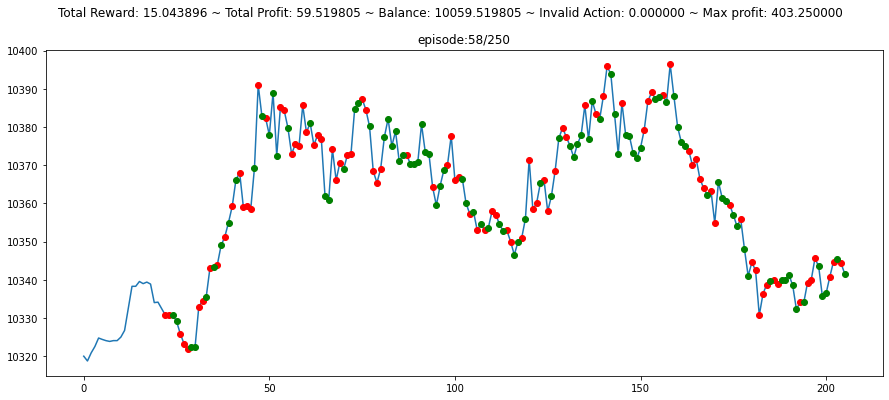

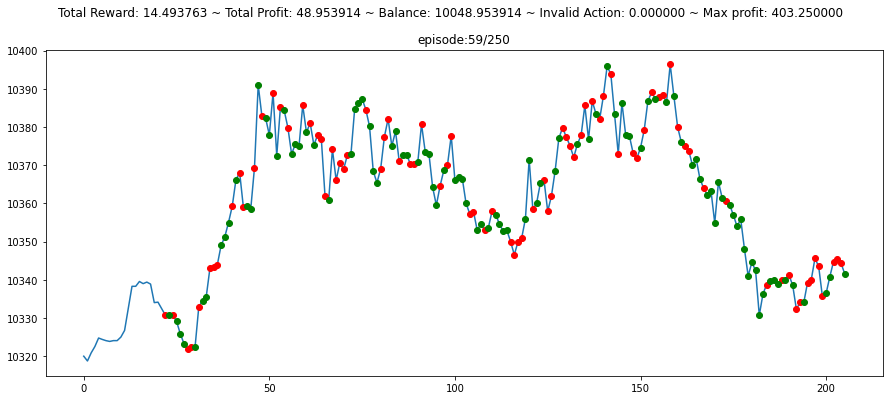

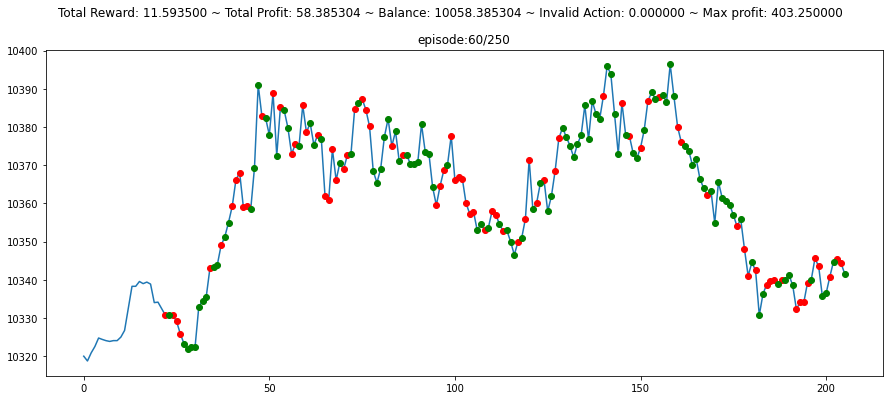

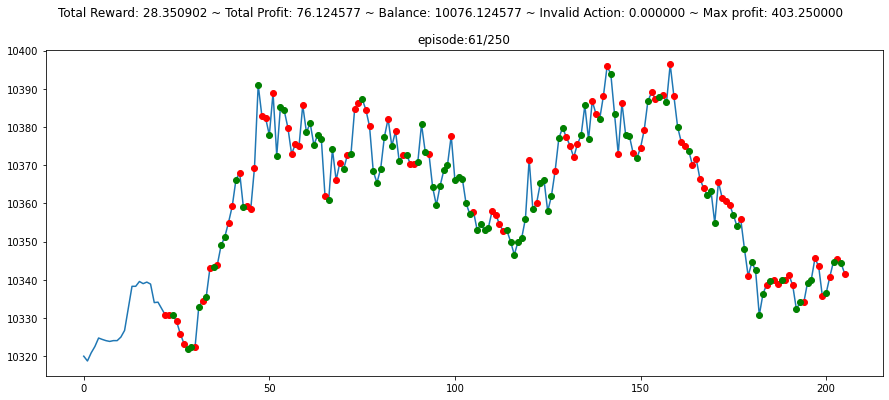

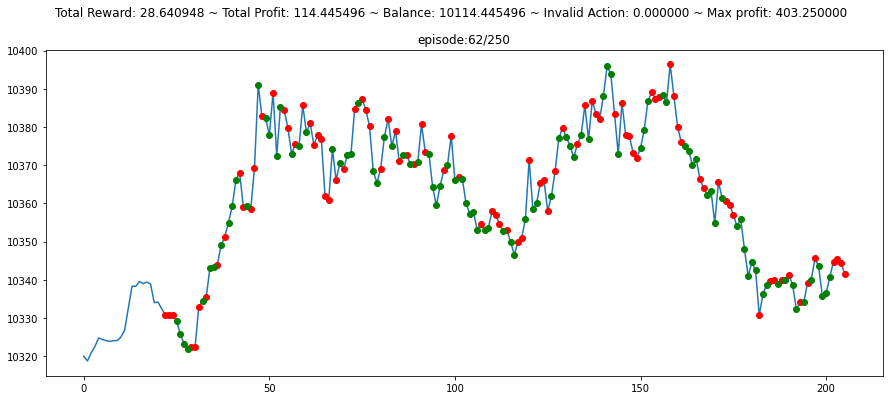

...

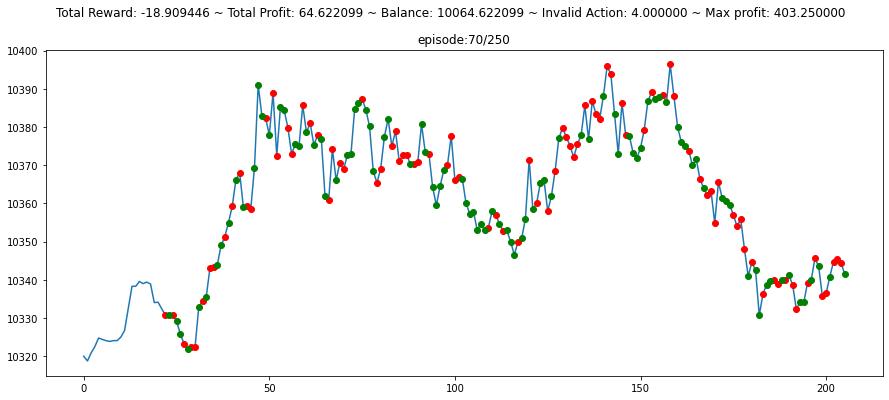

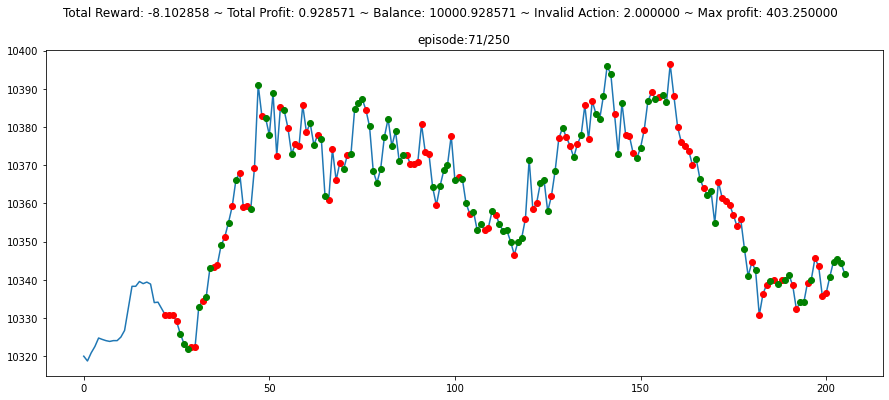

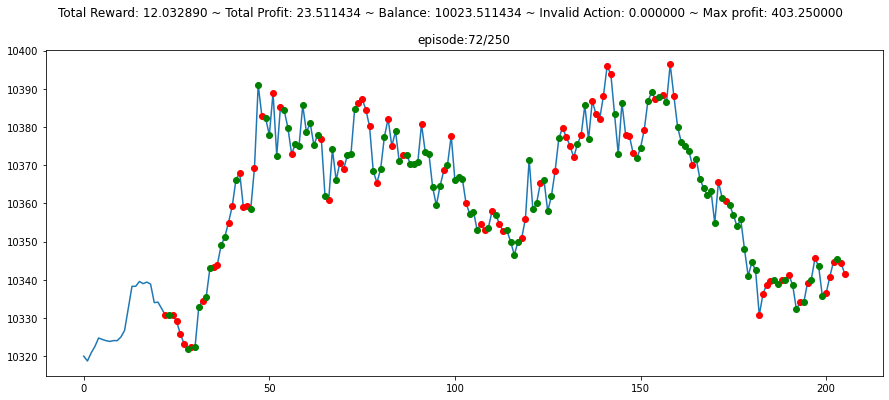

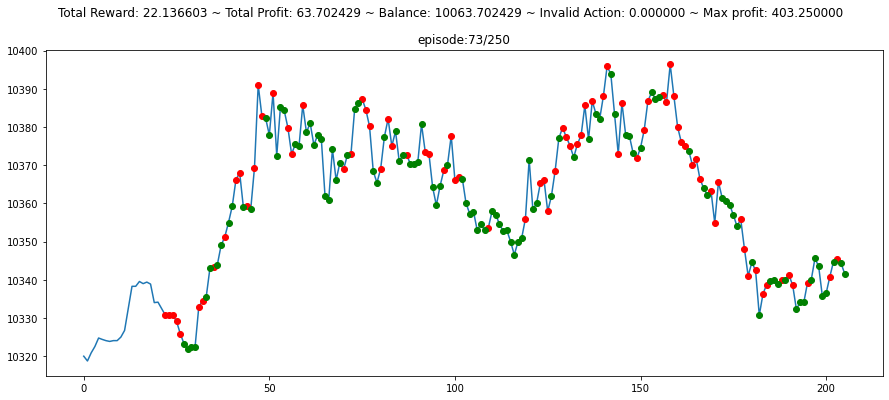

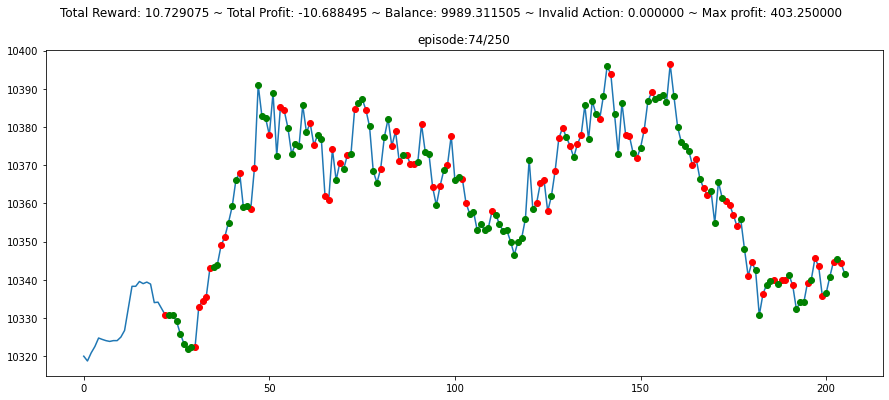

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:185: RuntimeWarning: invalid value encountered in double_scalars


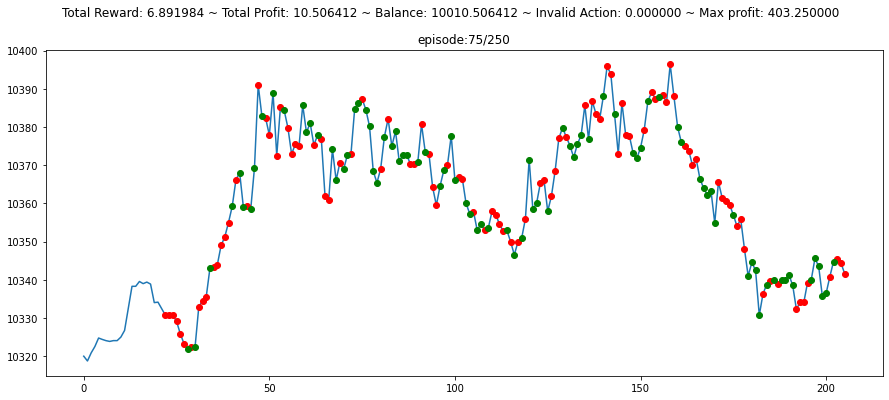

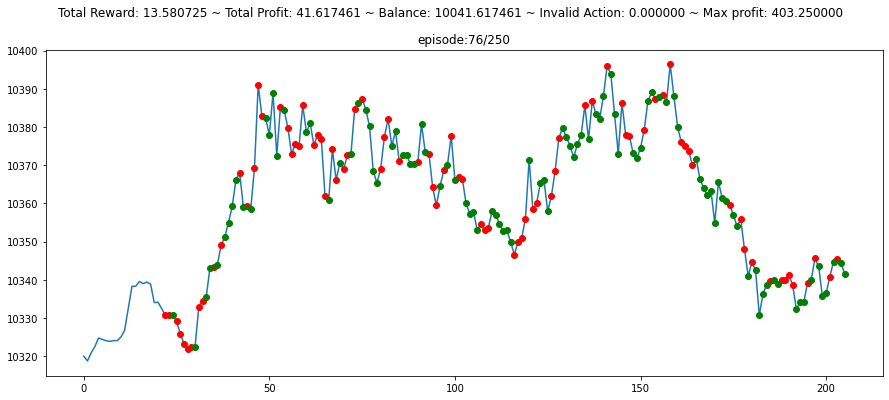

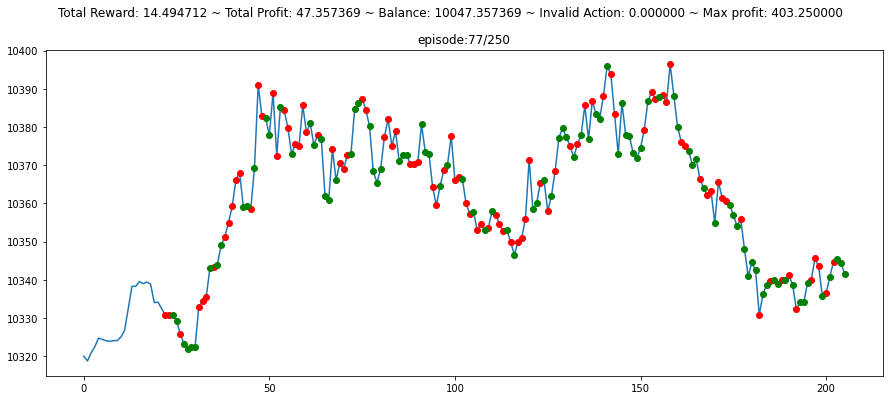

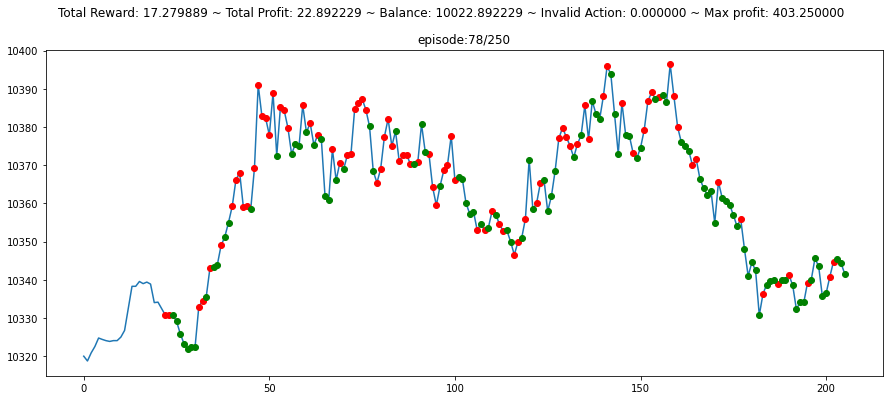

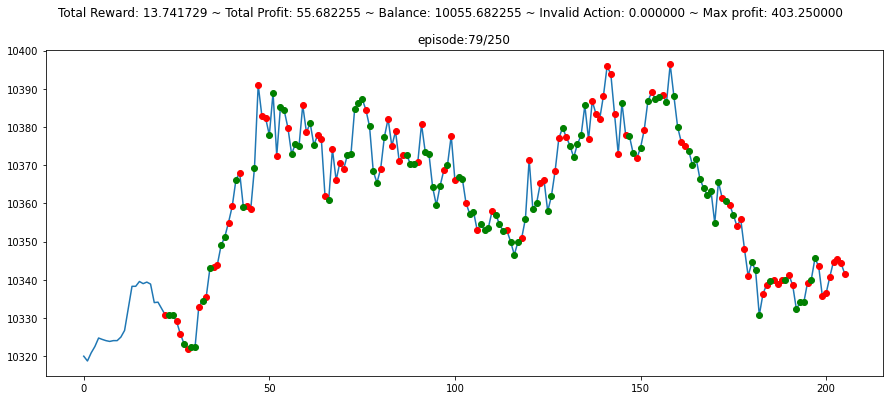

...

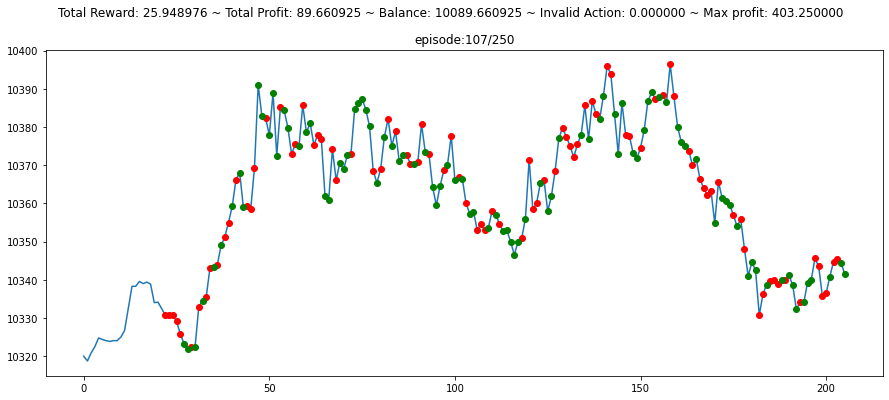

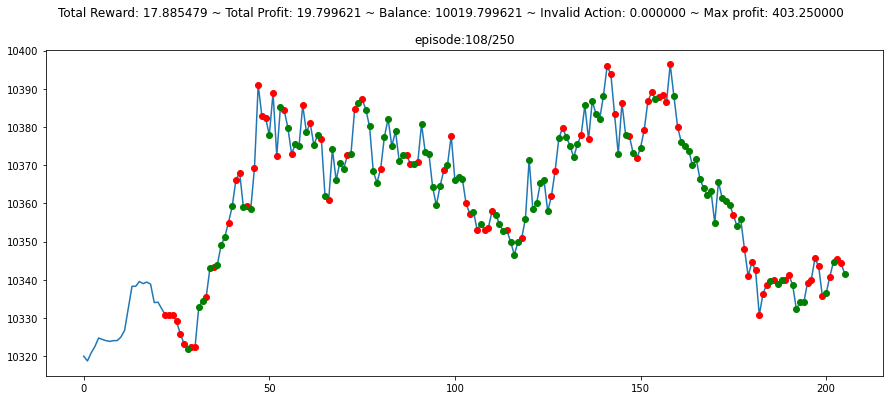

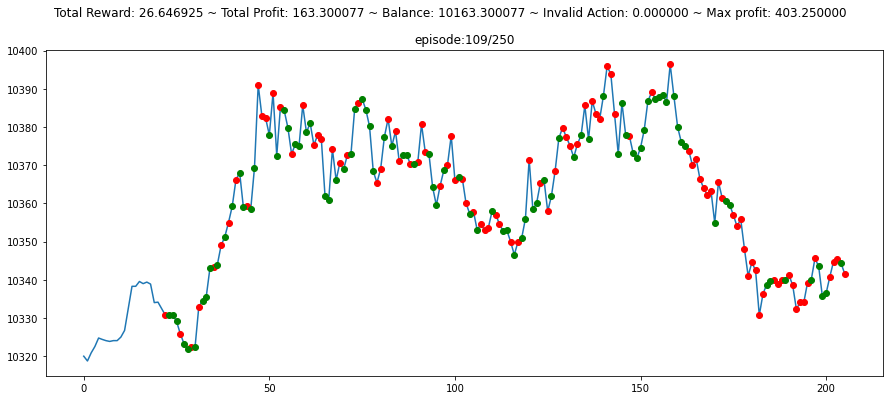

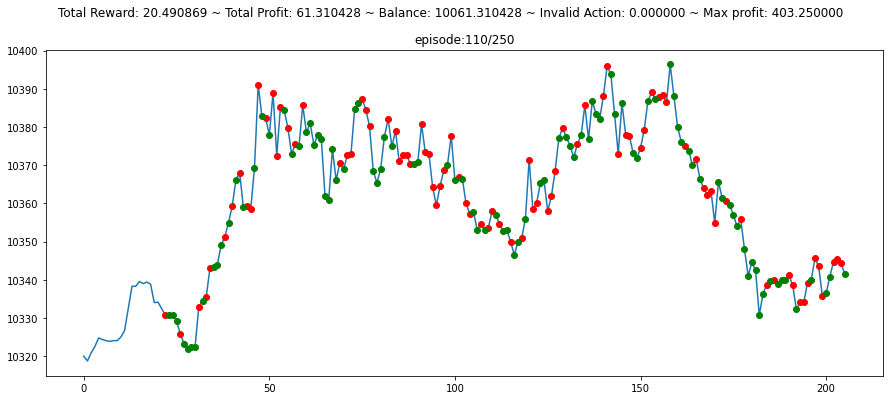

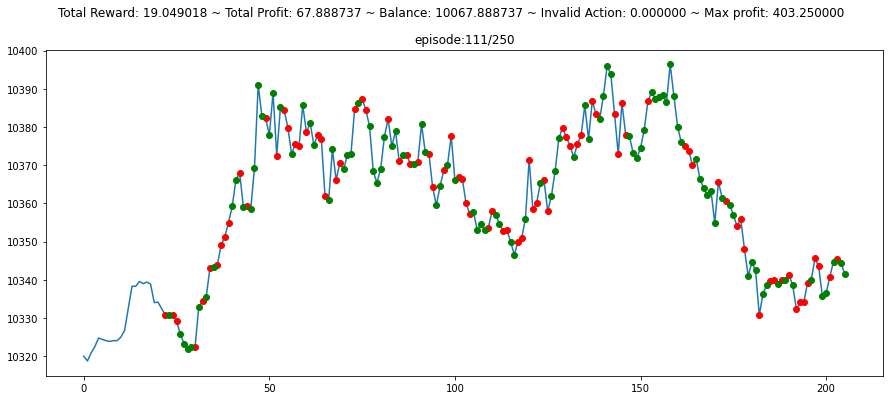

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:185: RuntimeWarning: invalid value encountered in double_scalars


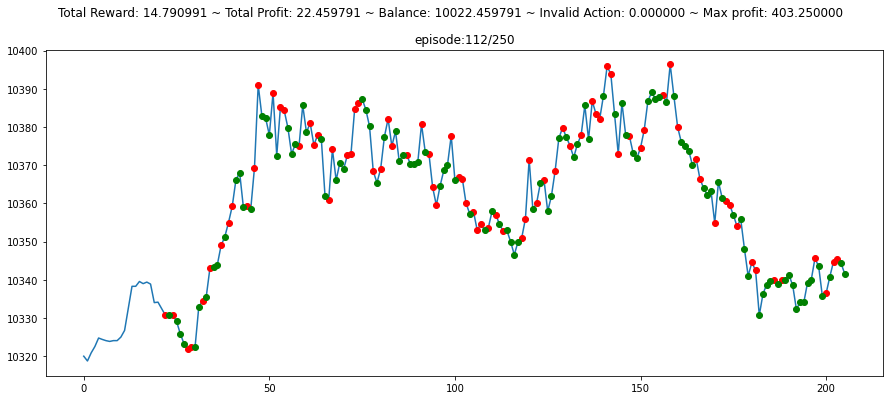

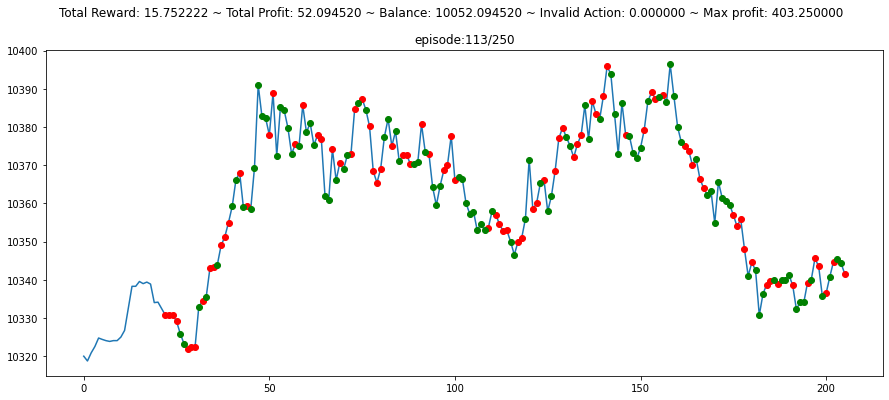

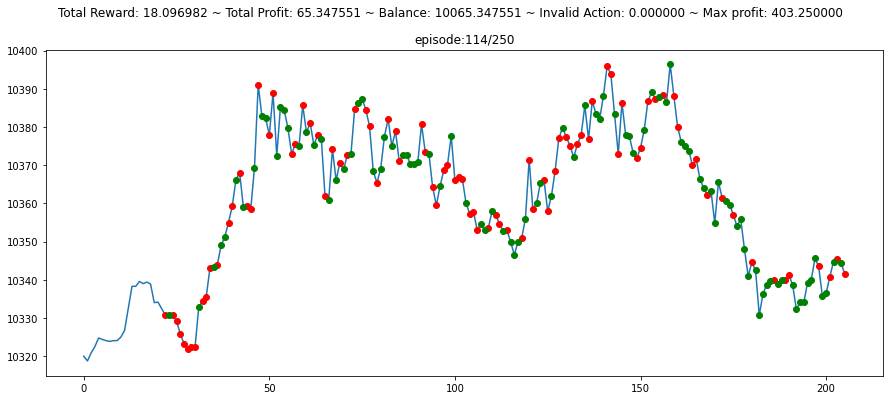

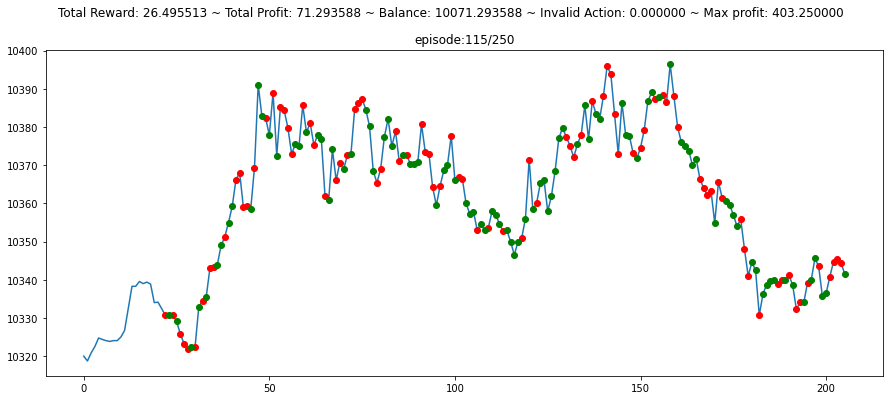

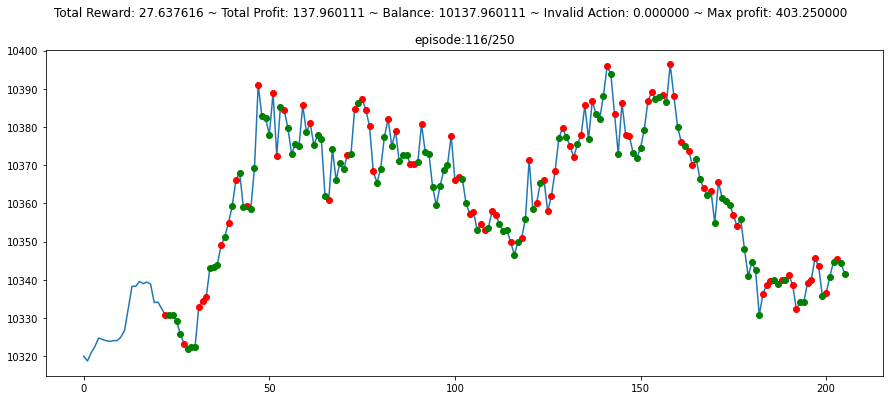

...

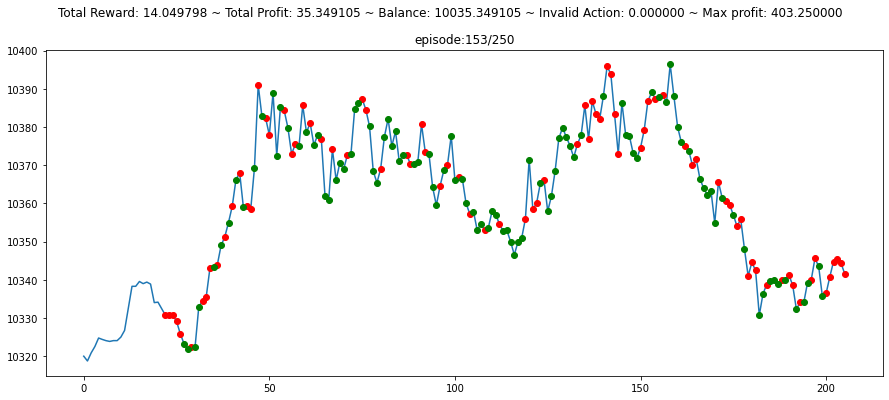

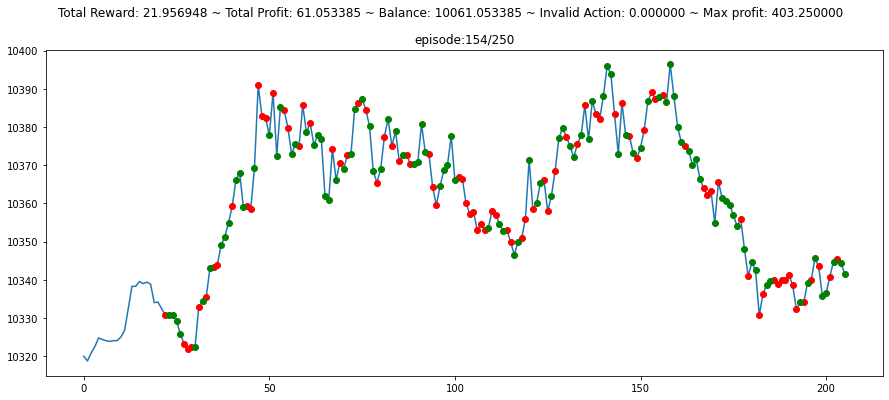

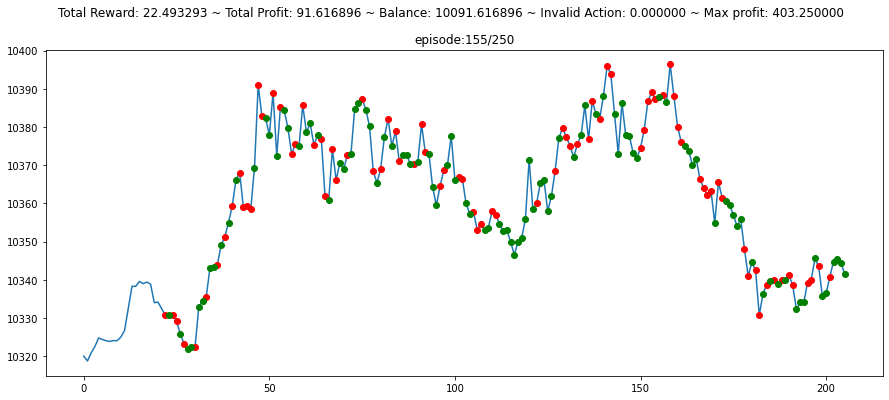

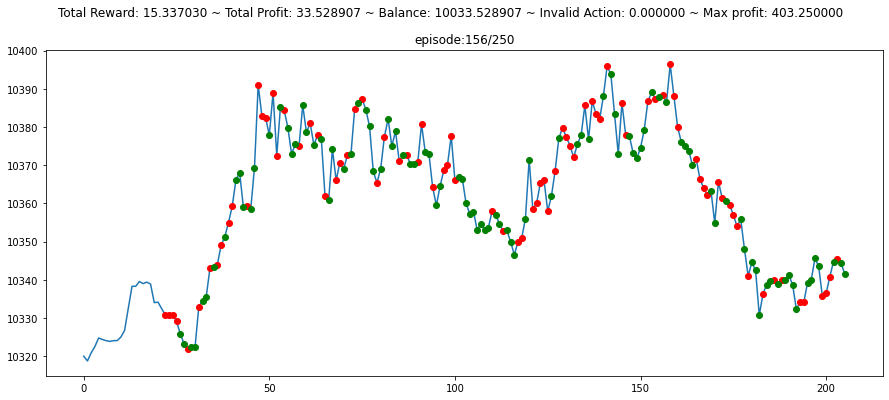

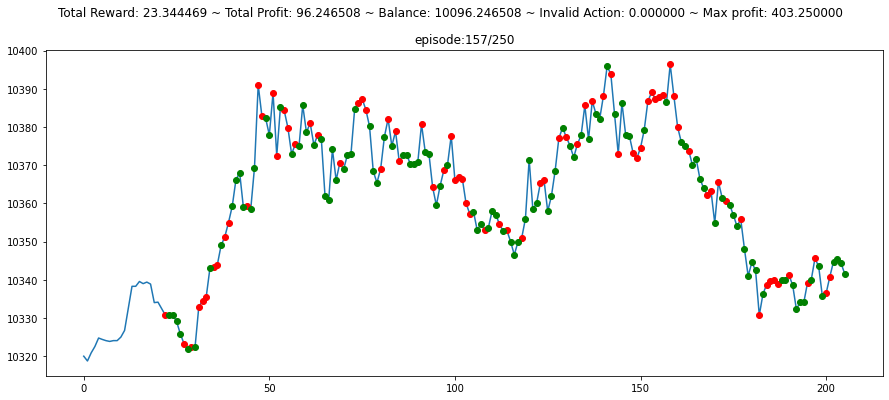

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:185: RuntimeWarning: invalid value encountered in double_scalars


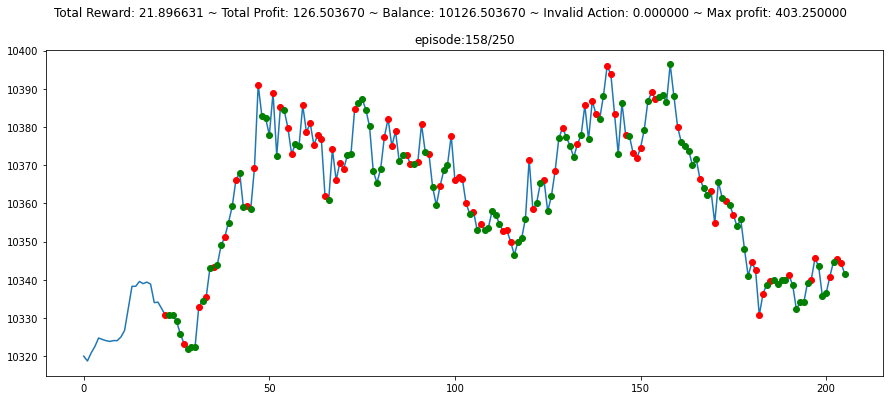

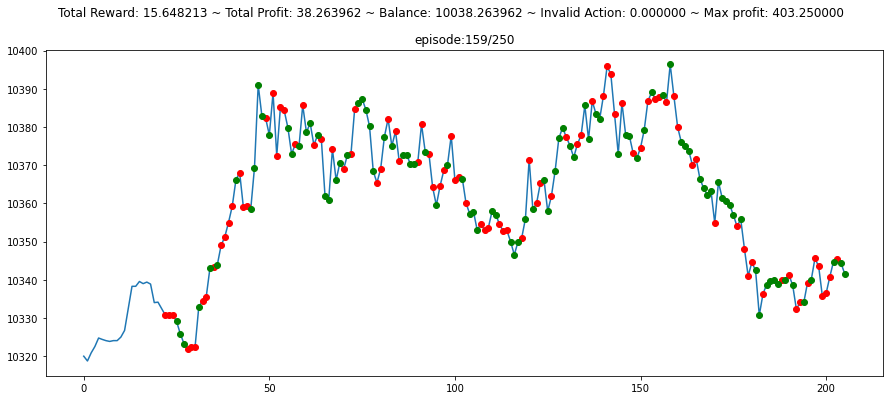

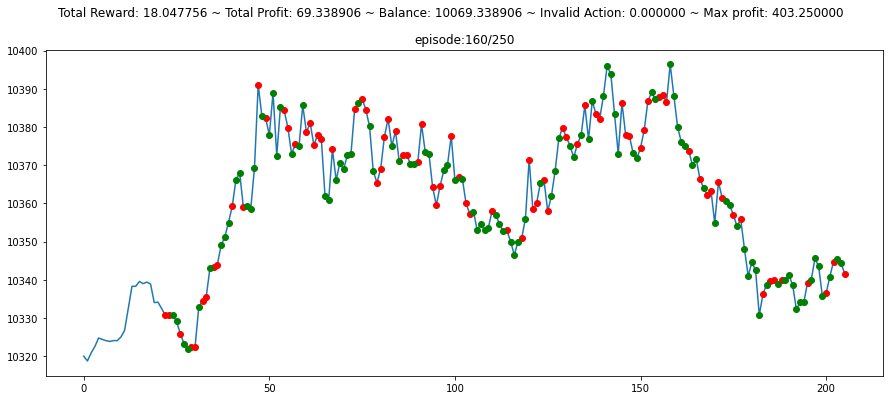

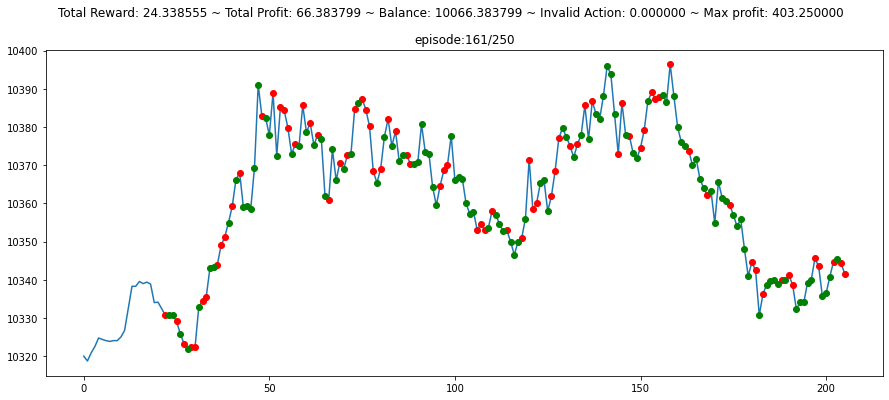

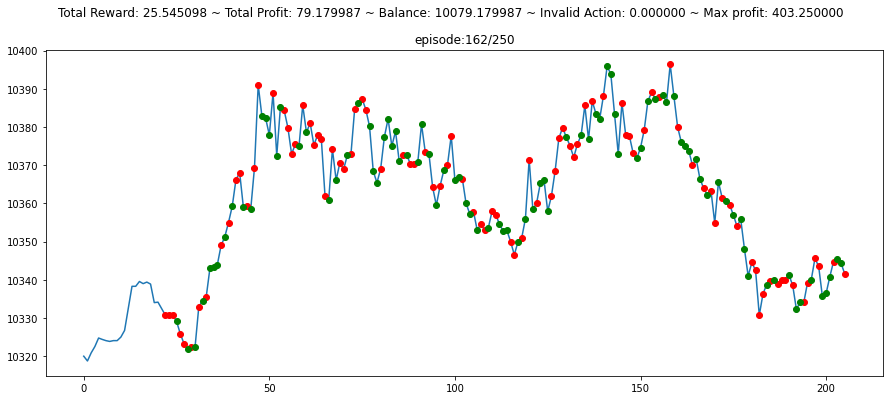

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:185: RuntimeWarning: invalid value encountered in double_scalars


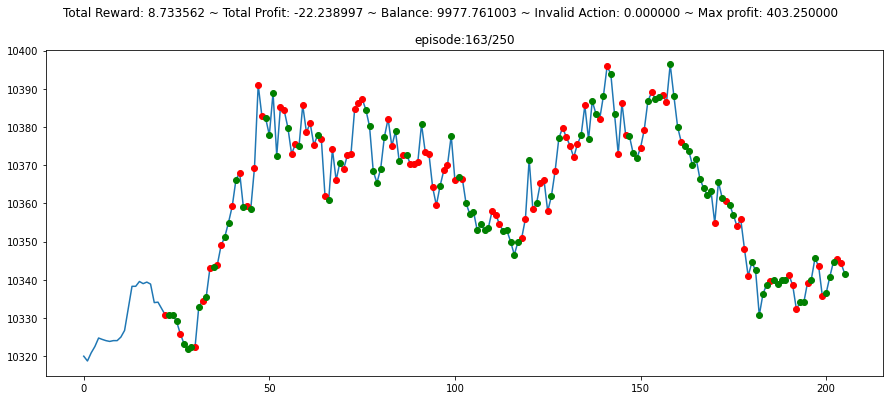

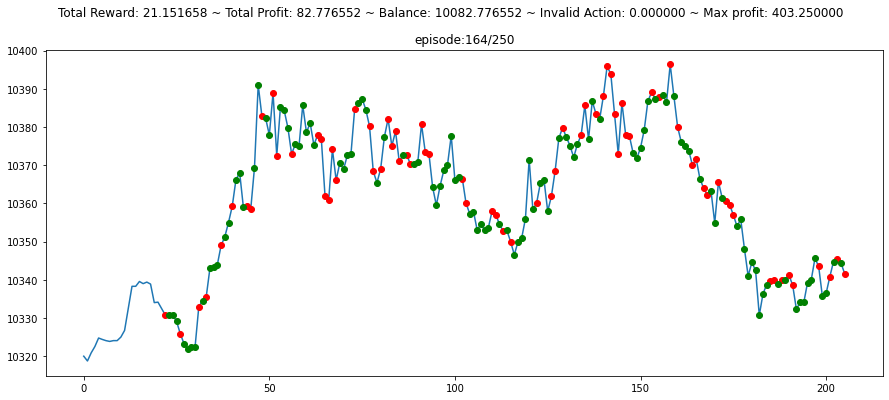

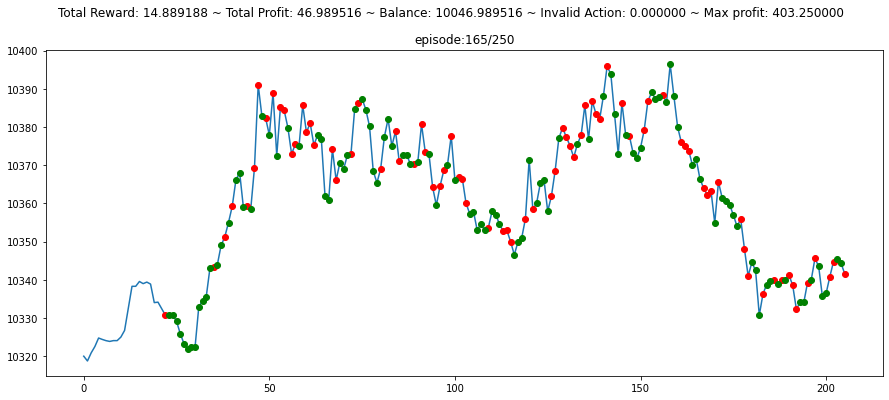

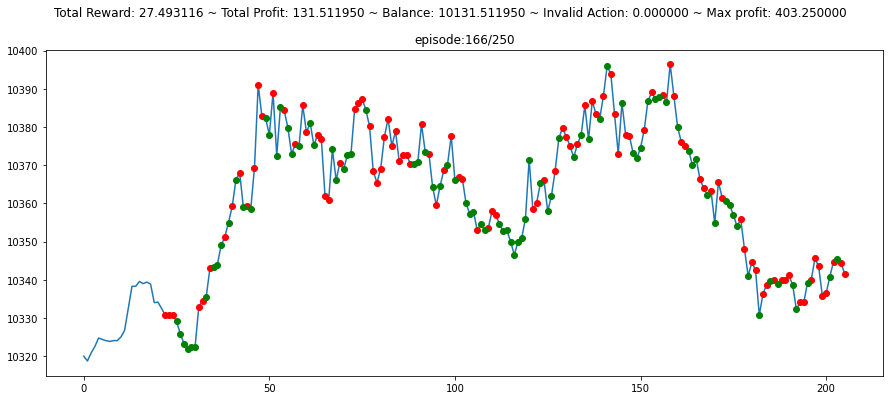

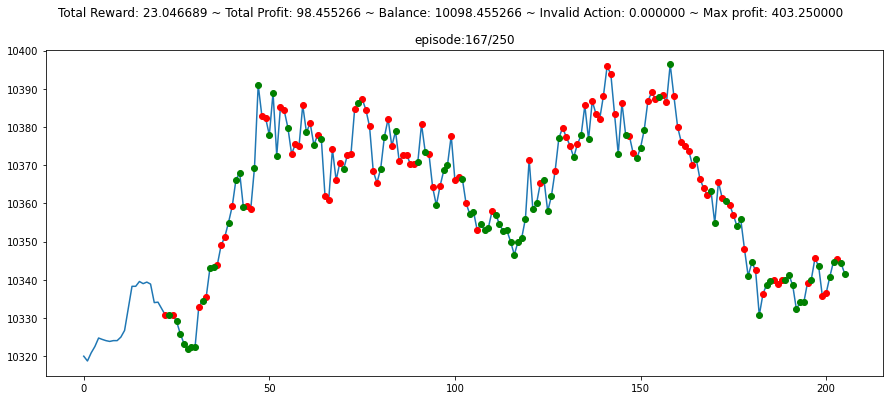

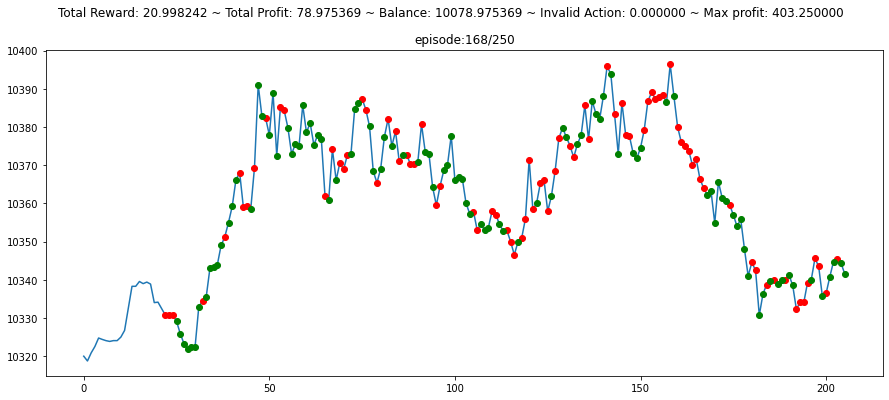

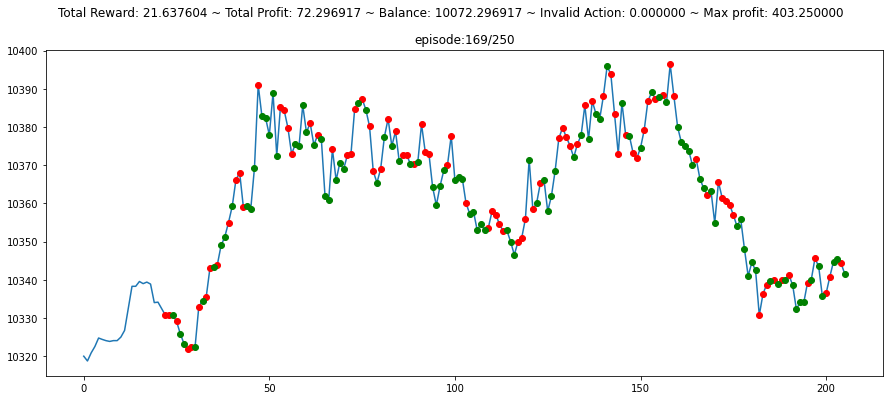

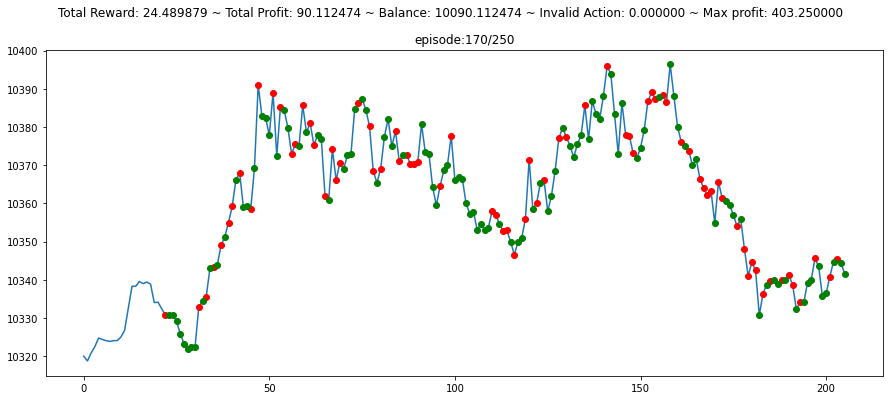

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:185: RuntimeWarning: invalid value encountered in double_scalars


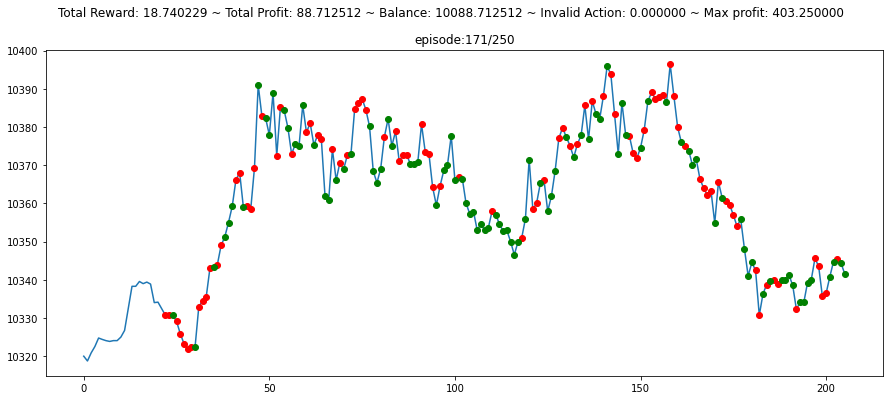

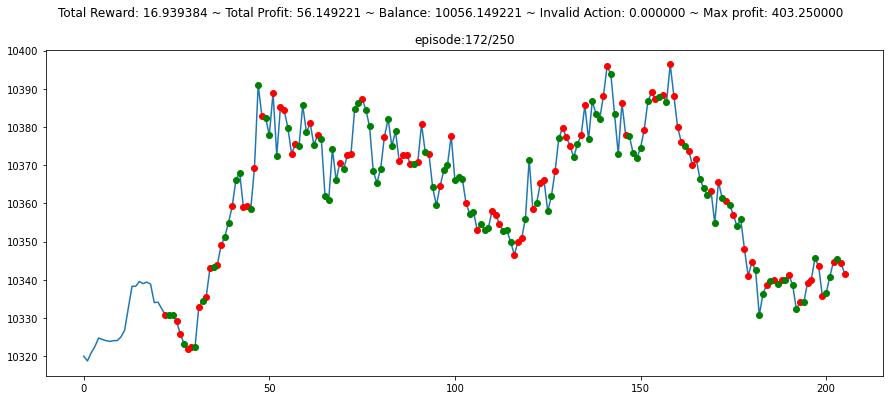

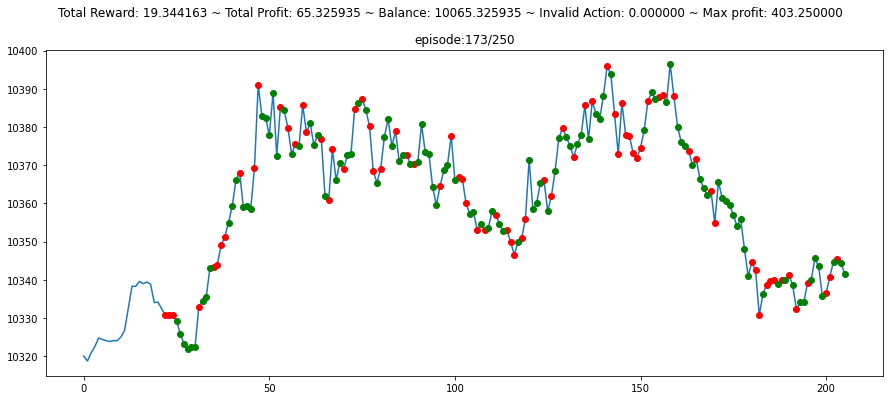

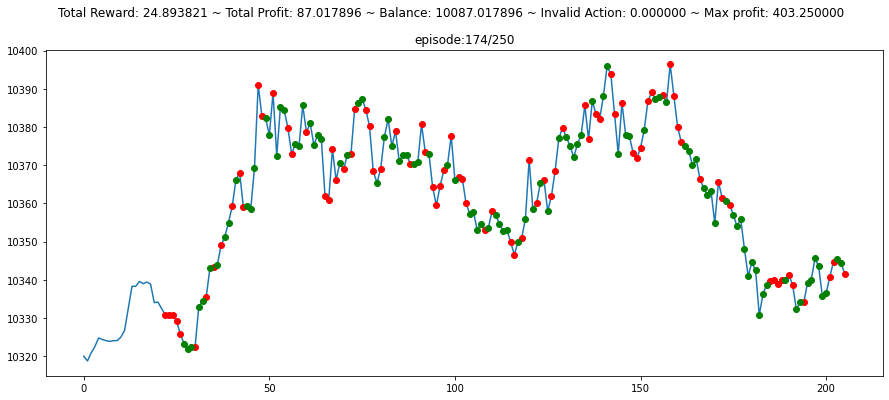

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:185: RuntimeWarning: invalid value encountered in double_scalars


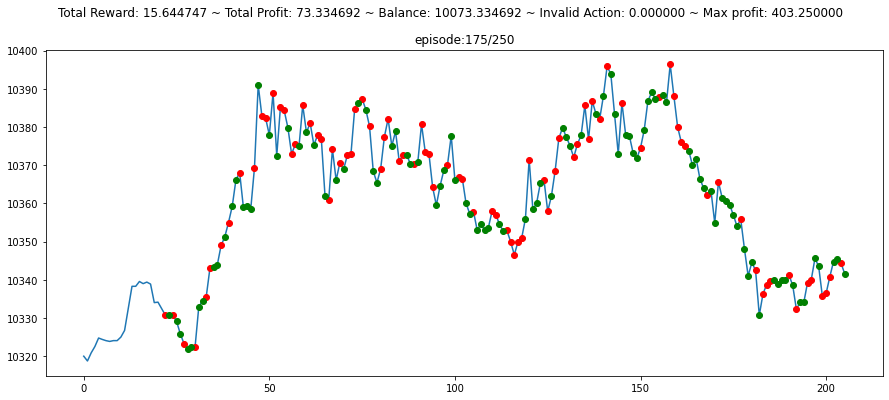

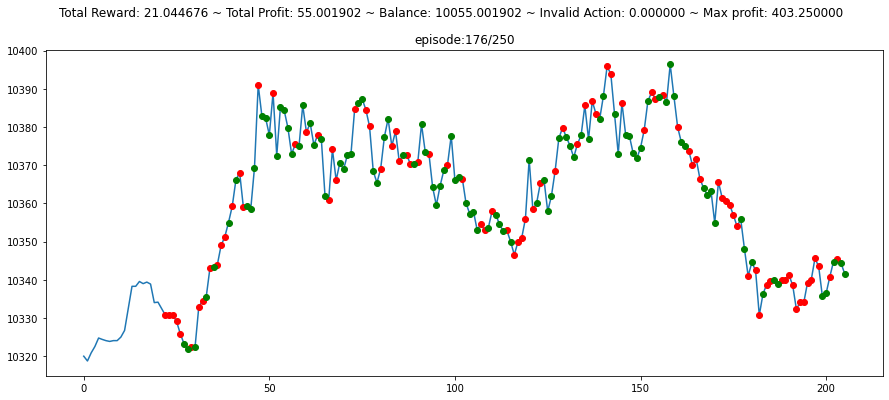

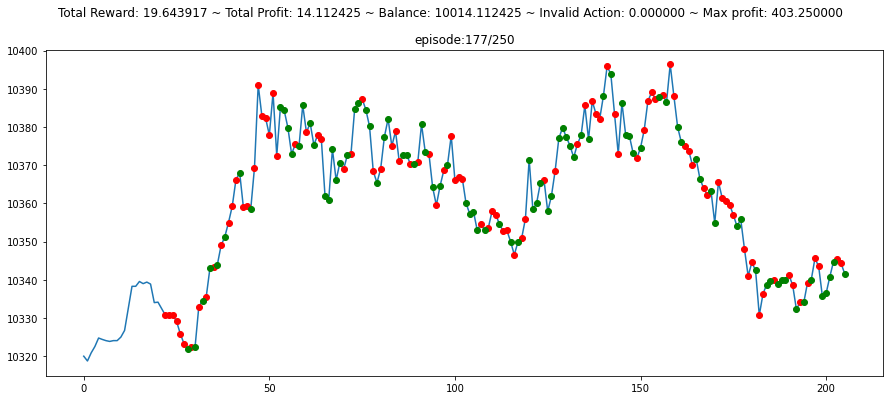

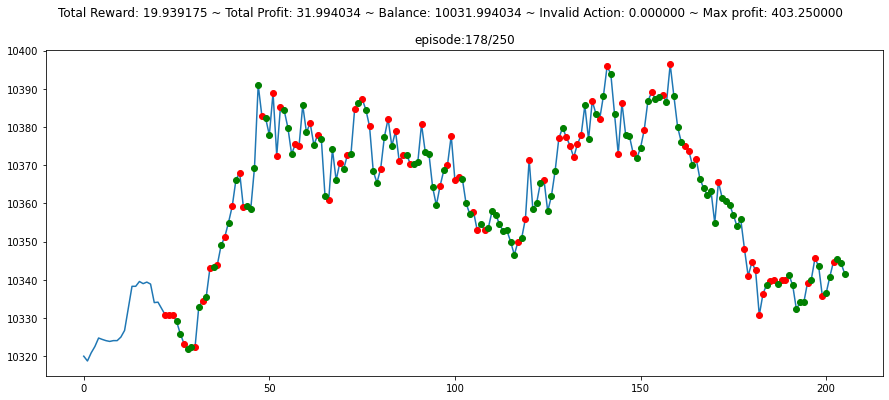

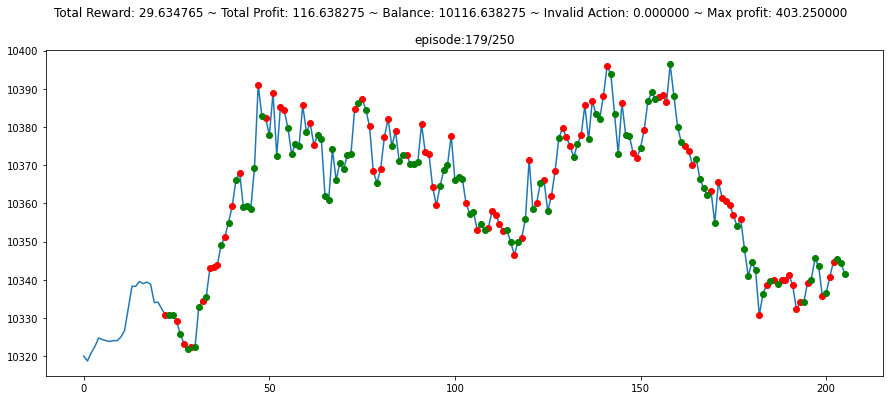

...

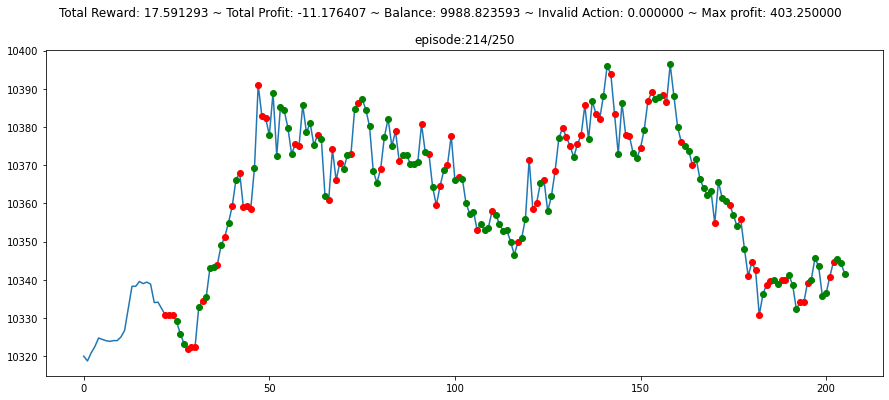

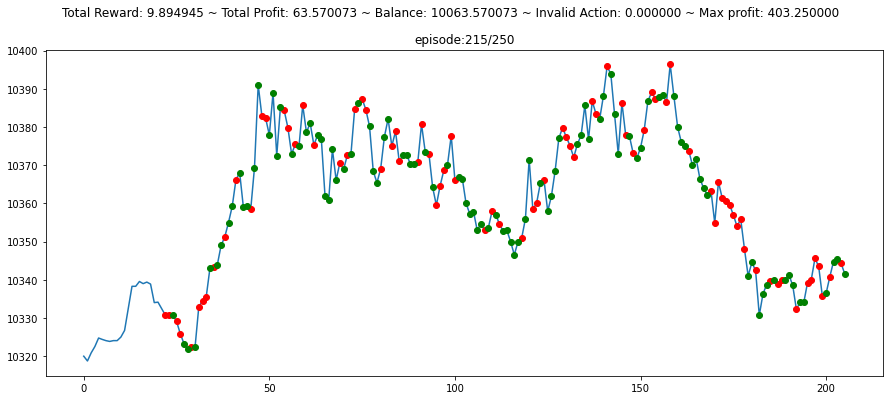

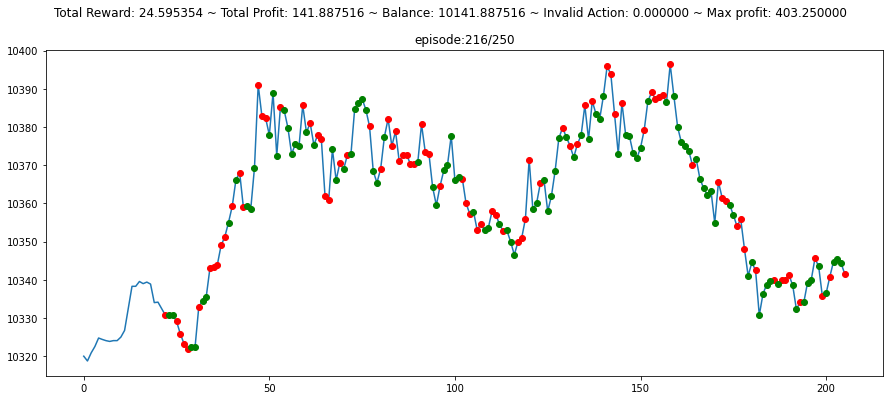

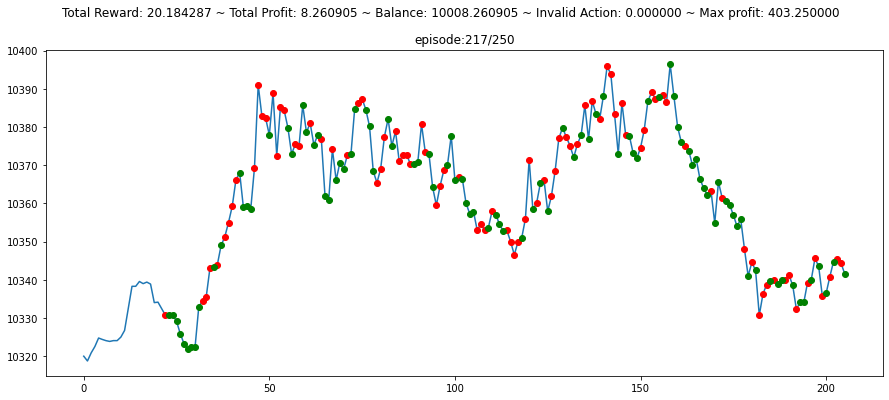

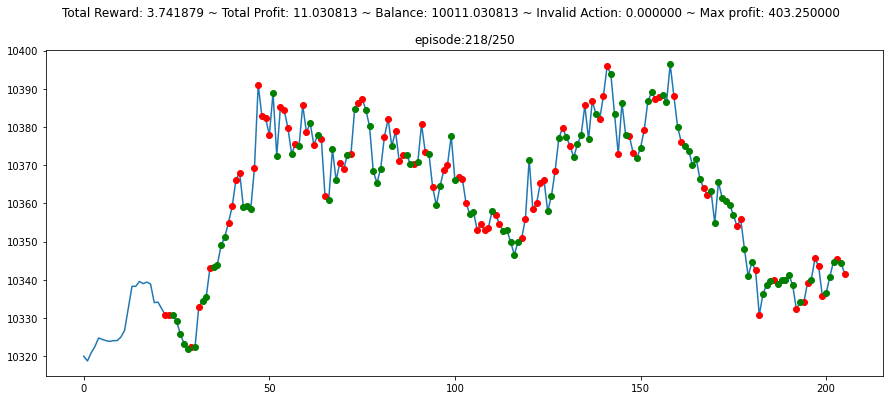

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:185: RuntimeWarning: invalid value encountered in double_scalars


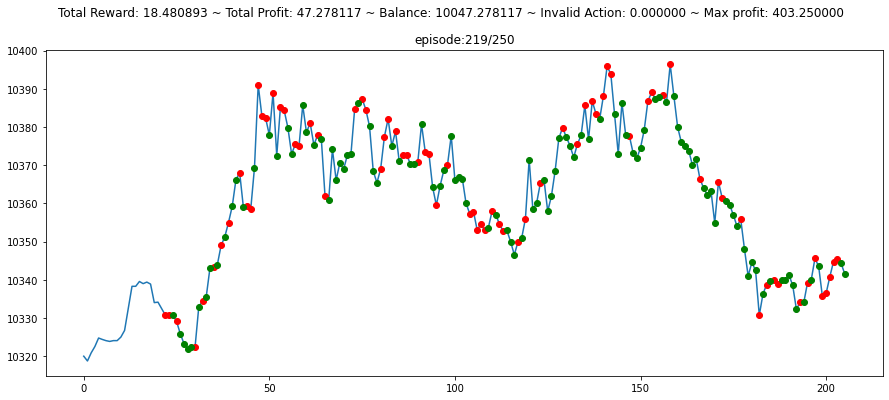

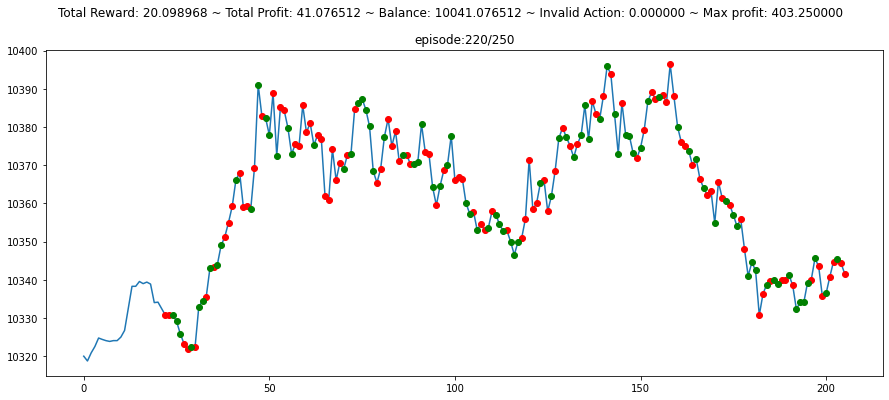

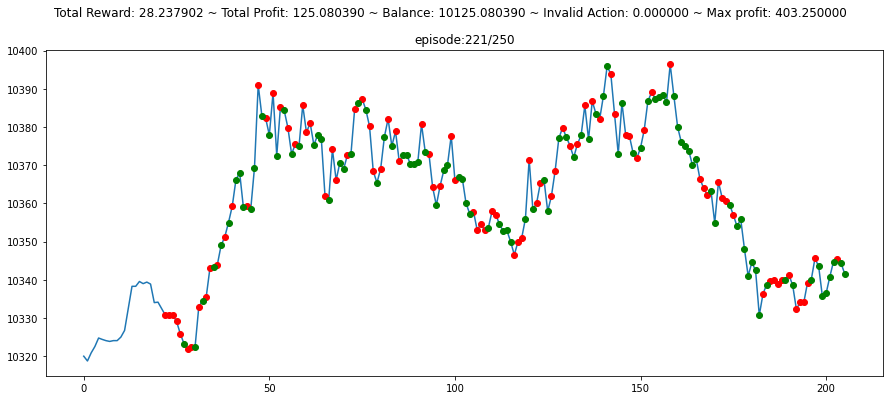

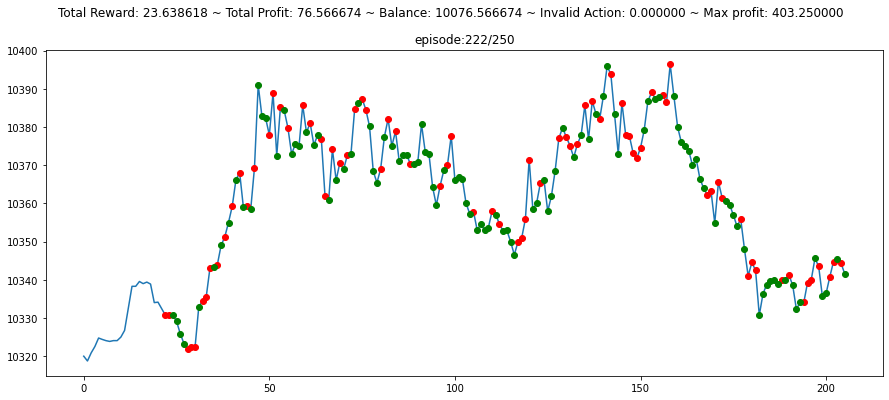

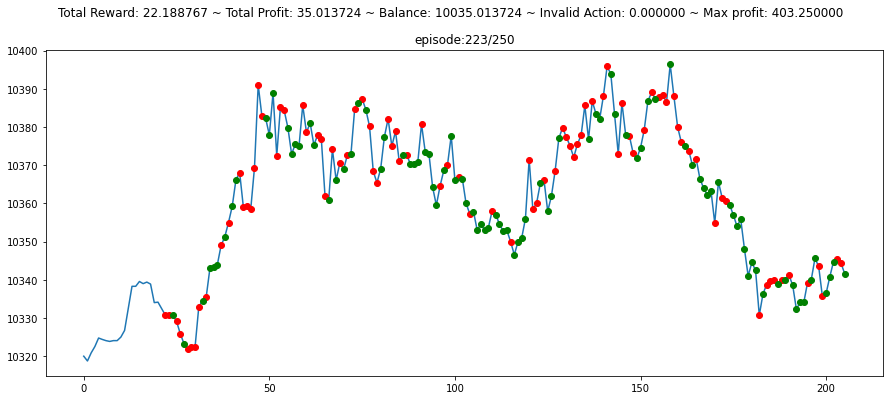

...

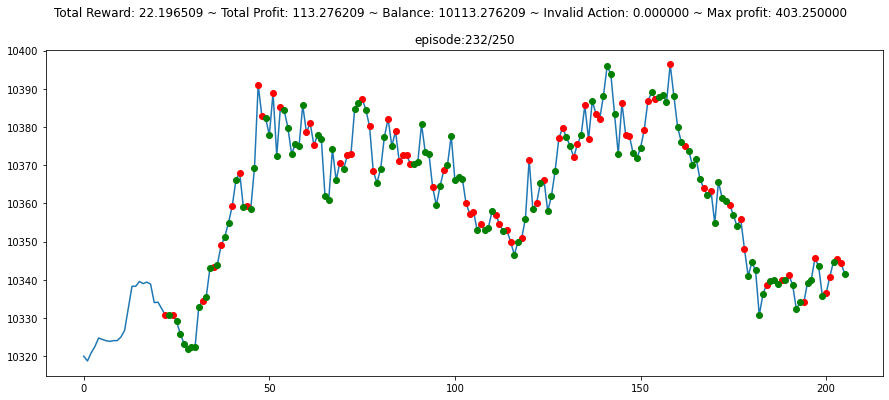

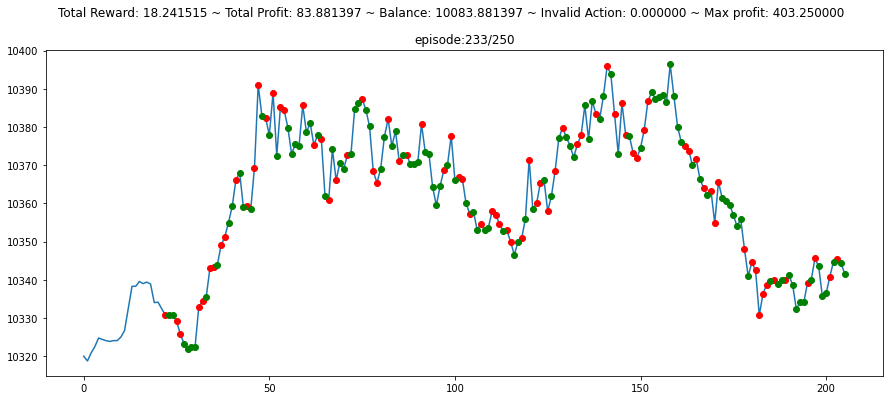

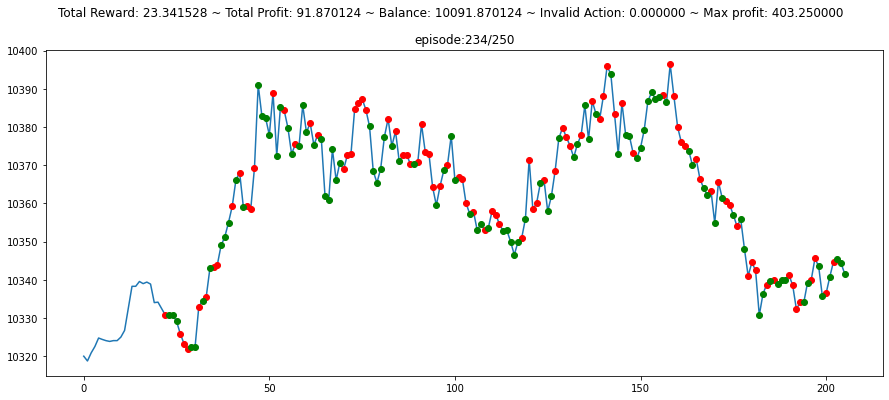

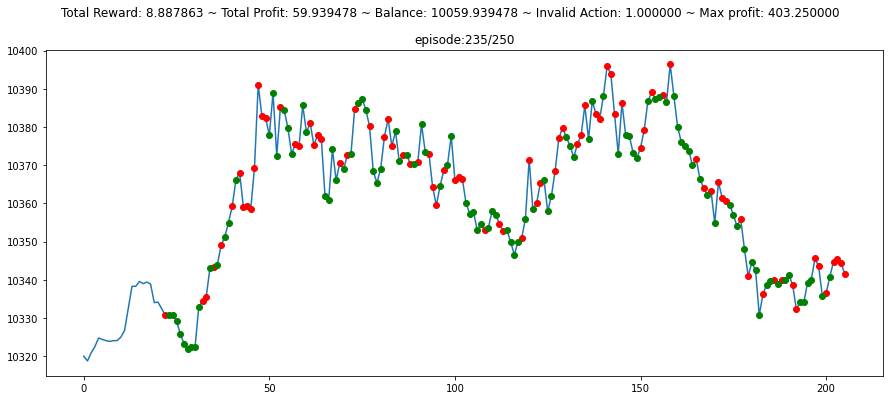

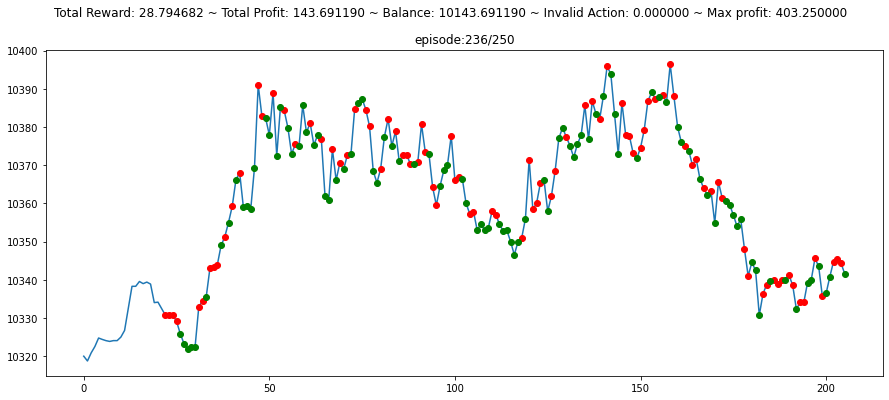

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:185: RuntimeWarning: invalid value encountered in double_scalars


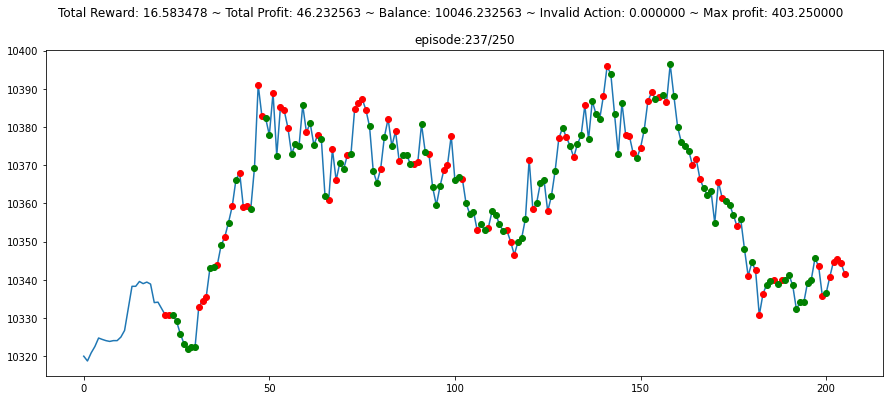

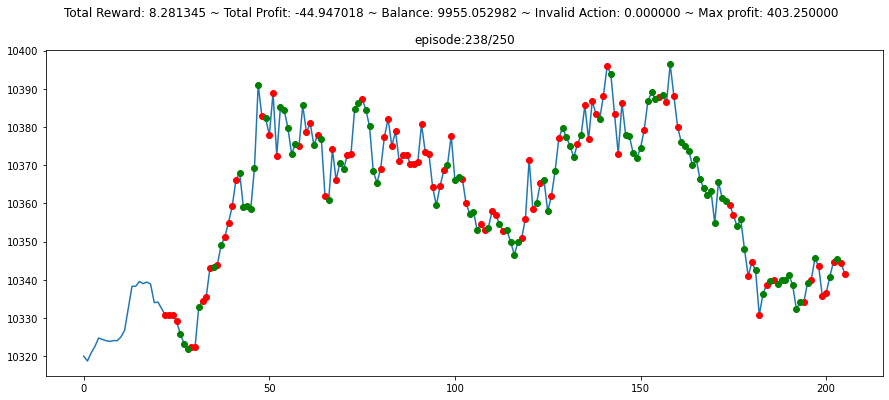

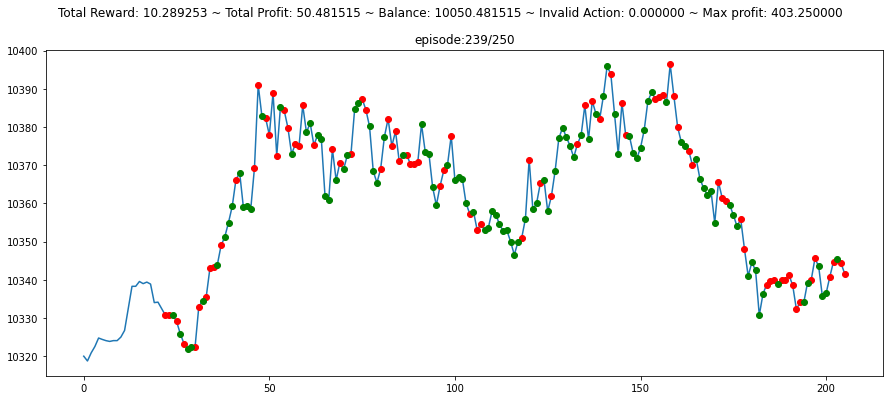

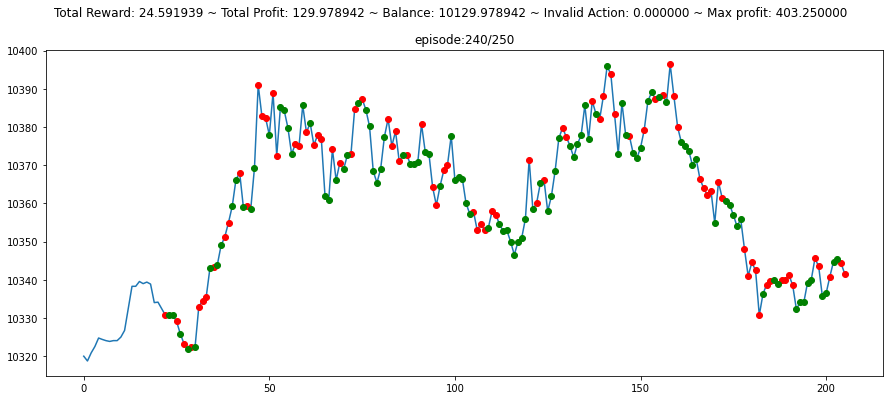

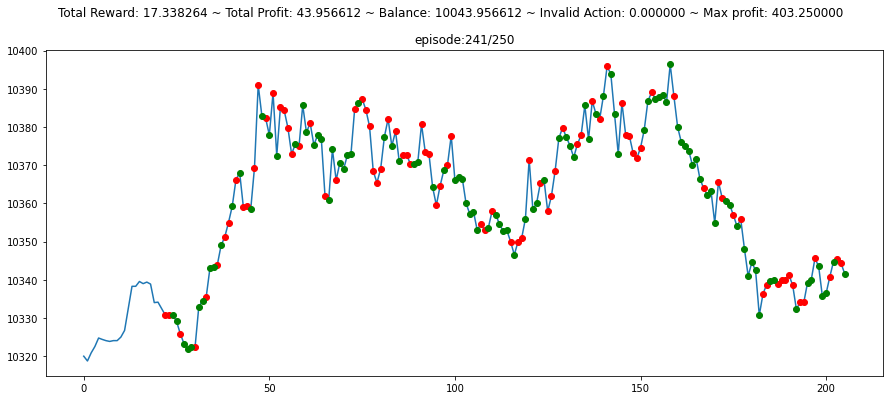

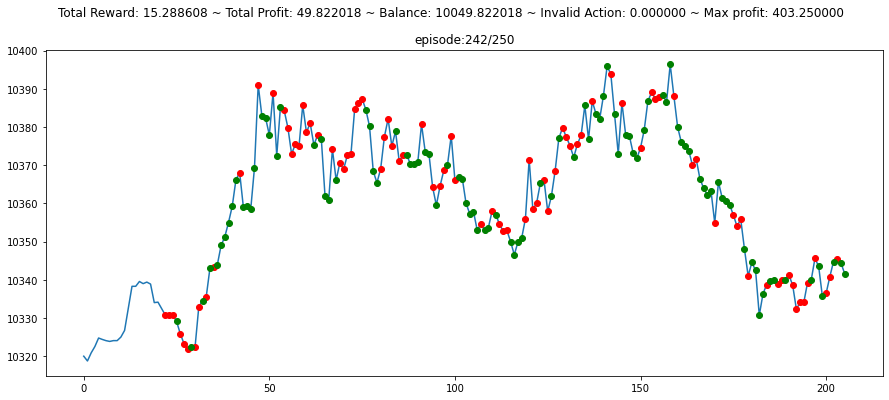

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:185: RuntimeWarning: invalid value encountered in double_scalars


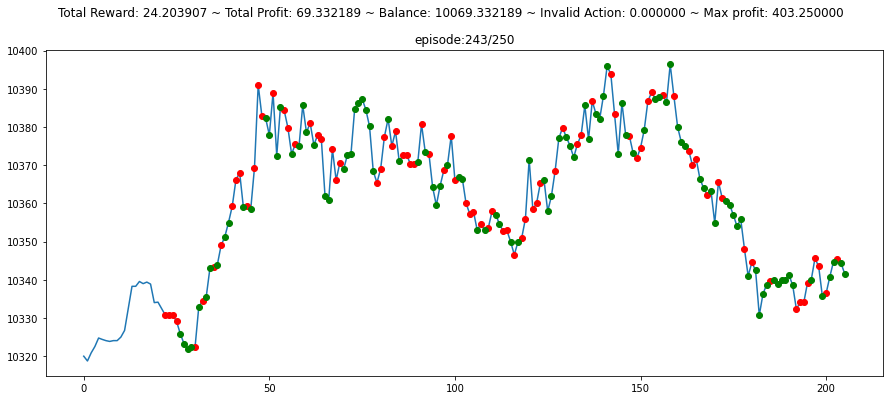

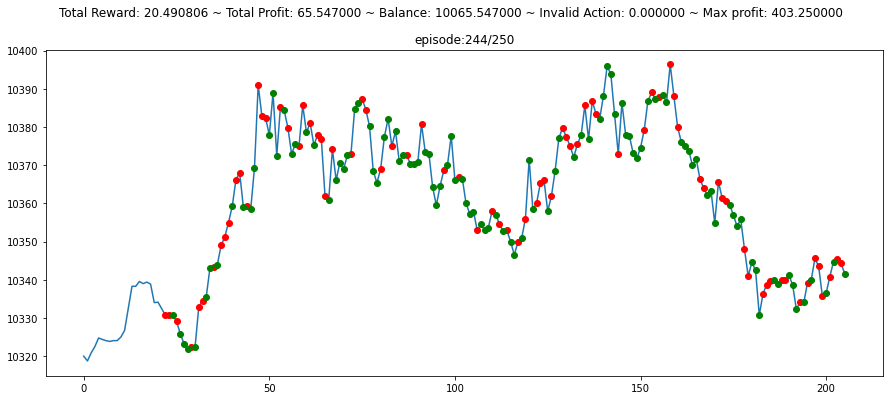

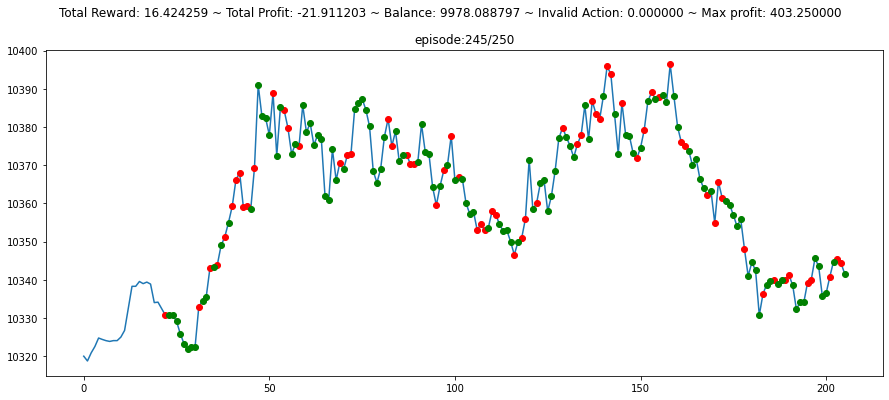

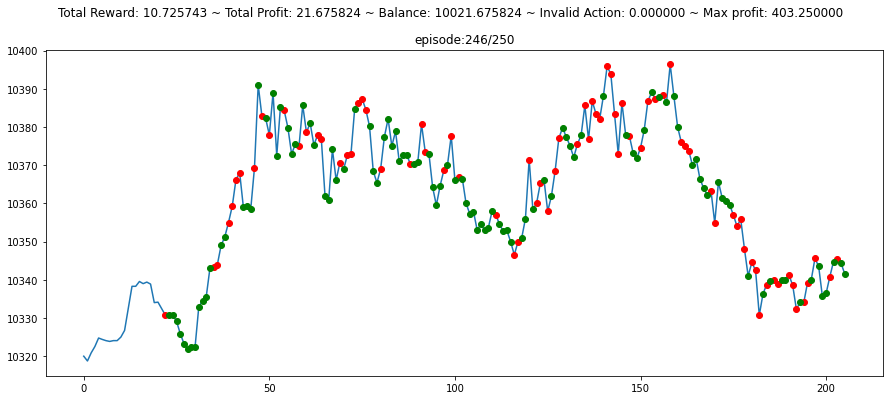

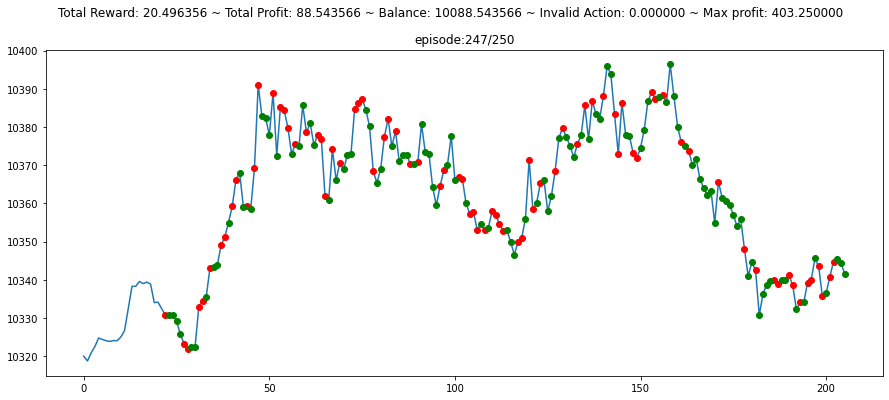

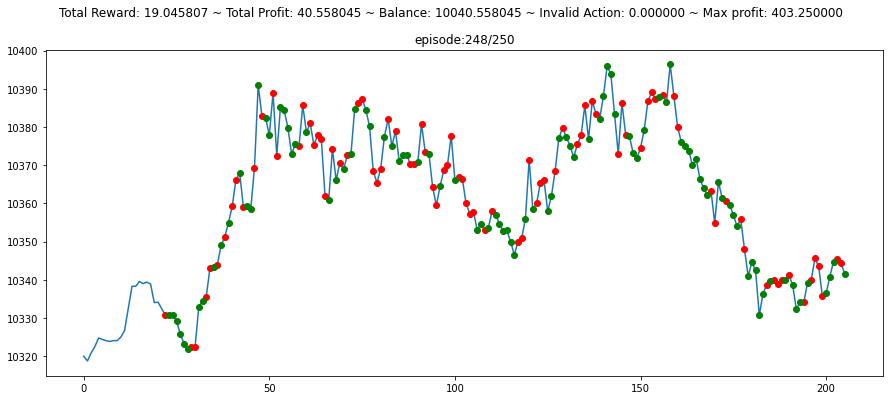

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:185: RuntimeWarning: invalid value encountered in double_scalars


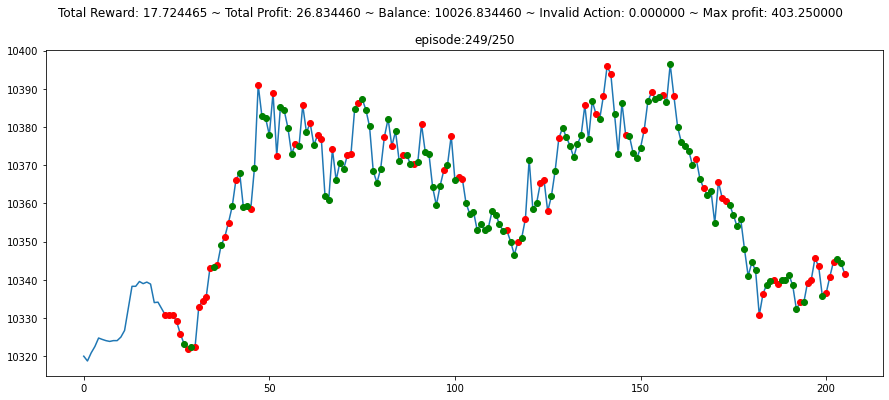

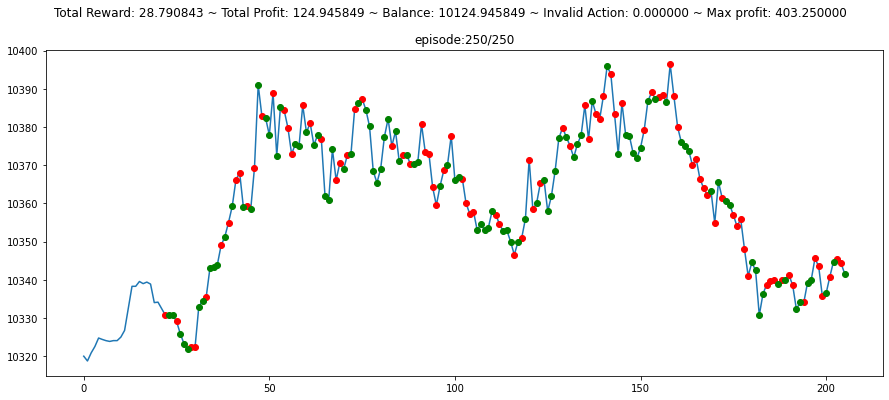

Finished.


In [ ]:
n_episodes = 250
max_episode_len = 500
for i in range(1, n_episodes + 1):
    obs = env.reset()
    obs = obs.flatten()
    R = 0  # return (sum of rewards)
    t = 0  # time step
    while True:
        # Uncomment to watch the behavior in a GUI window
        # env.render()
        action = agent.act(obs)
        obs, reward, done, _ = env.step(action)
        obs = obs.flatten()
        R += reward
        t += 1
        reset = t == max_episode_len
        agent.observe(obs, reward, done, reset)
        if done or reset:
            break
    
    info_training = f"episode:{i}/{n_episodes}"
    # place a text box in upper left in axes coords
    
    plt.figure(figsize=(15,6))
    plt.title(info_training)
    env.render_all()
    #plt.set_xlabel("X_axis_title")
    
    plt.show()
print('Finished.')

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


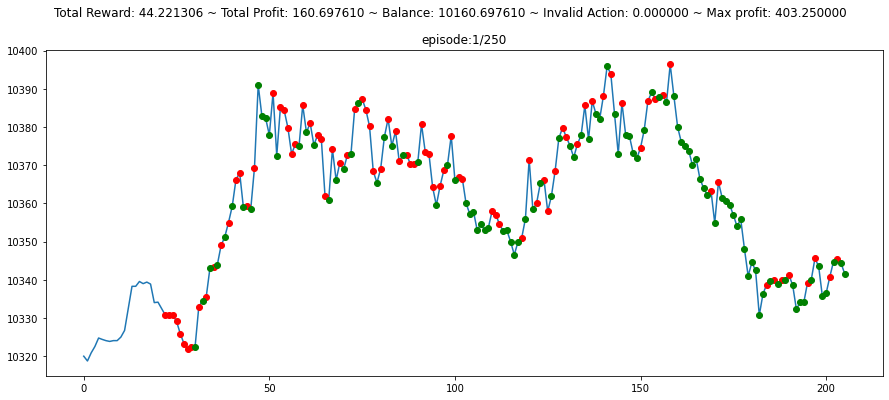

Finished.


In [ ]:
#riprendi l'env con altre obs
env = gym.make(id_str, df=df, frame_bound=(66,250), window_size=22)
with agent.eval_mode():
  for i in range(1, 2):
    obs = env.reset()
    
    while True:
        # Uncomment to watch the behavior in a GUI window
        # env.render()
        action = agent.act(obs)
        obs, reward, done, _ = env.step(action)
        reset = t == max_episode_len
        agent.observe(obs, reward, done, reset)
        if done or reset:
            break
    
    info_training = f"episode:{i}/{n_episodes}"
    plt.figure(figsize=(15,6))
    plt.title(info_training)
    env.render_all()
    #plt.set_xlabel("X_axis_title")
    
    plt.show()
print('Finished.')

